# GUC Clustering Project 

**Objective:** 
The objective of this project teach students how to apply clustering to real data sets

The projects aims to teach student: 
* Which clustering approach to use
* Compare between Kmeans, Hierarchal, DBScan, and Gaussian Mixtures  
* How to tune the parameters of each data approach
* What is the effect of different distance functions (optional) 
* How to evaluate clustering approachs 
* How to display the output
* What is the effect of normalizing the data 

Students in this project will use ready-made functions from Sklearn, plotnine, numpy and pandas 
 



 # if plotnine is not installed in Jupter then use the following command to install it 


Running this project require the following imports 

In [5]:
pip install plotnine --user

  Using cached plotnine-0.10.1-py3-none-any.whl (1.2 MB)
  Using cached mizani-0.8.1-py3-none-any.whl (64 kB)
  Using cached statsmodels-0.13.5-cp39-cp39-win_amd64.whl (9.2 MB)
  Using cached matplotlib-3.7.0-cp39-cp39-win_amd64.whl (7.6 MB)
Note: you may need to restart the kernel to use updated packages.


In [2]:
import warnings
warnings.filterwarnings('ignore')
import seaborn as sns 
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np
import sklearn.preprocessing as prep
from sklearn.datasets import make_blobs
from plotnine import *   
# StandardScaler is a function to normalize the data 
# You may also check MinMaxScaler and MaxAbsScaler 
#from sklearn.preprocessing import StandardScaler
from sklearn.neighbors import NearestNeighbors

from sklearn.cluster import DBSCAN


from sklearn.cluster import KMeans
from sklearn.mixture import GaussianMixture

from sklearn.metrics import silhouette_score

%matplotlib inline

In [3]:
# helper function that allows us to display data in 2 dimensions an highlights the clusters
def display_cluster(X,km=[],num_clusters=0):
    color = 'brgcmyk'  #List colors
    alpha = 0.5  #color obaque
    s = 20
    if num_clusters == 0:
        plt.scatter(X[:,0],X[:,1],c = color[0],alpha = alpha,s = s)
    else:
        for i in range(num_clusters):
            plt.scatter(X[km.labels_==i,0],X[km.labels_==i,1],c = color[i],alpha = alpha,s=s)
            plt.scatter(km.cluster_centers_[i][0],km.cluster_centers_[i][1],c = color[i], marker = 'x', s = 100)

## Multi Blob Data Set 
* The Data Set generated below has 6 cluster with varying number of users and varing densities
* Cluster the data set below using 



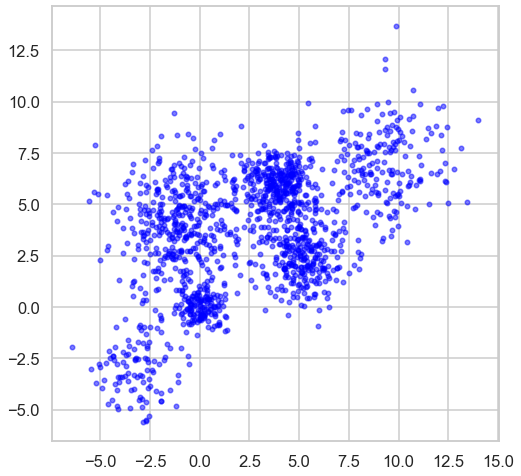

In [4]:
plt.rcParams['figure.figsize'] = [8,8]
sns.set_style("whitegrid")
sns.set_context("talk")

#n_bins = 6  
centers = [(-3, -3), (0, 0), (5,2.5),(-1, 4), (4, 6), (9,7)]
Multi_blob_Data, y = make_blobs(n_samples=[100,150, 300, 400,300, 200], n_features=2, cluster_std=[1.3,0.6, 1.2, 1.7,0.9,1.7],
                  centers=centers, shuffle=False, random_state=42)
display_cluster(Multi_blob_Data)

### Kmeans 
* Use Kmeans with different values of K to cluster the above data 
* Display the outcome of each value of K 
* Plot distortion function versus K and choose the appropriate value of k 
* Plot the silhouette_score versus K and use it to choose the best K 
* Store the silhouette_score for the best K for later comparison with other clustering techniques. 

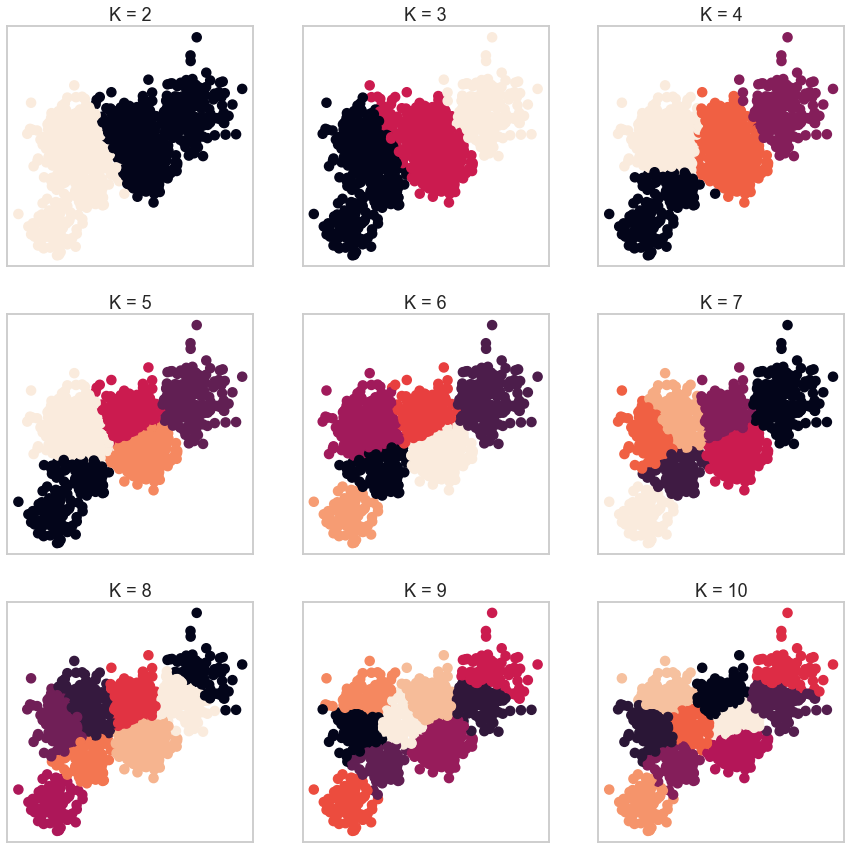

In [8]:
# Apply KMeans with different values of K
K = [2, 3, 4, 5, 6, 7, 8, 9, 10]
clusters = []
distortions = []

for k in K:
    kmeans = KMeans(n_clusters=k, random_state=42)
    kmeans.fit(Multi_blob_Data)
    clusters.append(kmeans.labels_)
    distortions.append(kmeans.inertia_)
# Representation of the clustering of each value of K
fig, axes = plt.subplots(3, 3, figsize=(15, 15))
axes = axes.ravel()

for i, ax in enumerate(axes):
    if i < len(K):
        ax.scatter(Multi_blob_Data[:, 0], Multi_blob_Data[:, 1], c=clusters[i])
        ax.set_title('K = {}'.format(K[i]))
        ax.set_xticks(())
        ax.set_yticks(())
    else:
        ax.axis('off')
        
plt.show()


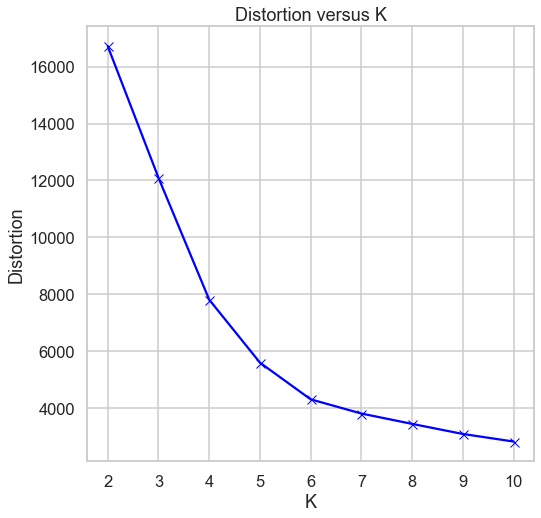

In [9]:
# Plot distortion function versus K
plt.plot(K, distortions, 'bx-')
plt.xlabel('K')
plt.ylabel('Distortion')
plt.title('Distortion versus K')
plt.show()


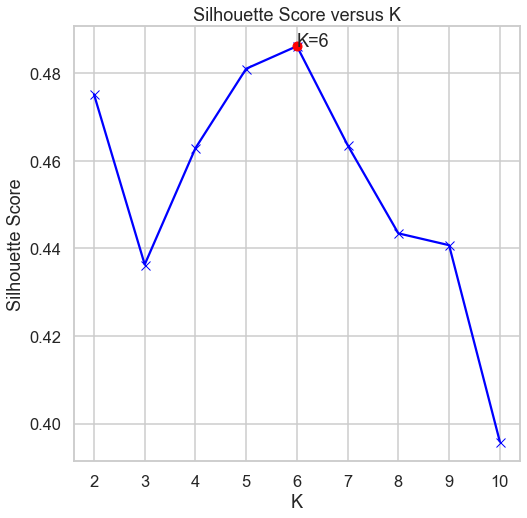

Best K: 6
Silhouette Score: 0.48614459735646176


In [12]:
# Plot silhouette_score versus K
silhouette_scores = []

for k in K:
    labels = clusters[k-2]
    score = silhouette_score(Multi_blob_Data, labels)
    silhouette_scores.append(score)
    
max_score = max(silhouette_scores)
best_k = K[silhouette_scores.index(max_score)]
plt.plot(K, silhouette_scores, 'bx-')
plt.plot(best_k, max_score, 'ro')
plt.annotate('K={}'.format(best_k), xy=(best_k, max_score),)

plt.xlabel('K')
plt.ylabel('Silhouette Score')
plt.title('Silhouette Score versus K')

plt.show()
print('Best K:', best_k)
print('Silhouette Score:', max_score)

In [ ]:
## To choose the best K, we can observe the plot of the silhouette score versus K and look for the highest score. 
## In the above plot, we can see that the highest silhouette score is achieved at K = 6, 
## which cmatches the earlier observation from the distortion plot. 

### Hierarchal Clustering
* Use AgglomerativeClustering function to cluster the above data 
* In the  AgglomerativeClustering change the following parameters 
    * Affinity (use euclidean, manhattan and cosine)
    * Linkage( use average and single )
    * Distance_threshold (try different)
* For each of these trials plot the Dendograph , calculate the silhouette_score and display the resulting clusters  
* Find the set of paramters that would find result in the best silhouette_score and store this score for later comparison with other clustering techniques. 
* Record your observation 

Best silhouette score: 0.07699405164704985 with parameters: {'affinity': 'cosine', 'linkage': 'single', 'distance_threshold': 0.005}


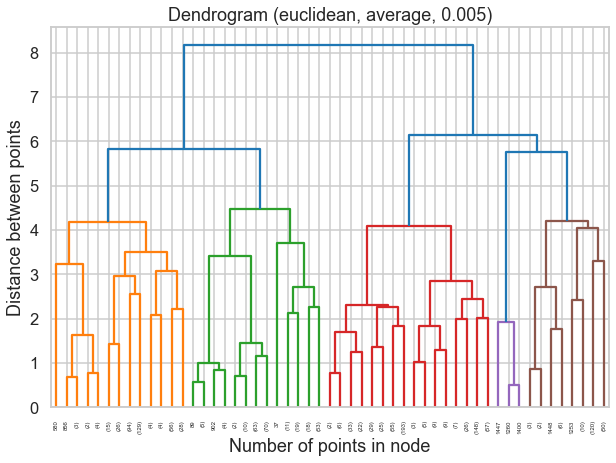

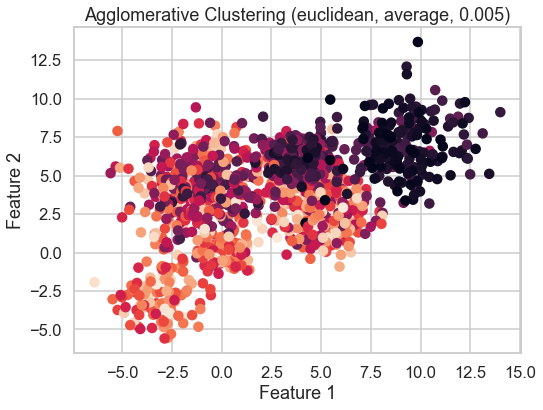

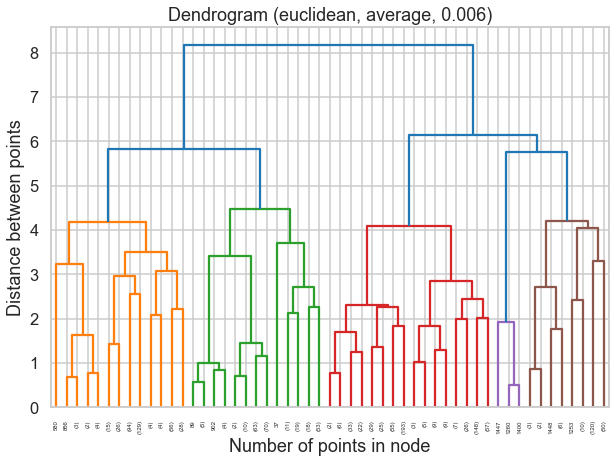

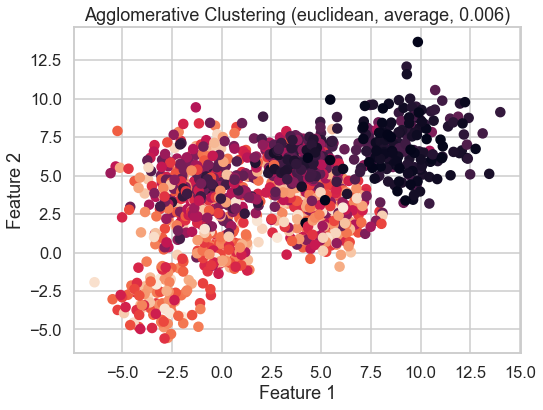

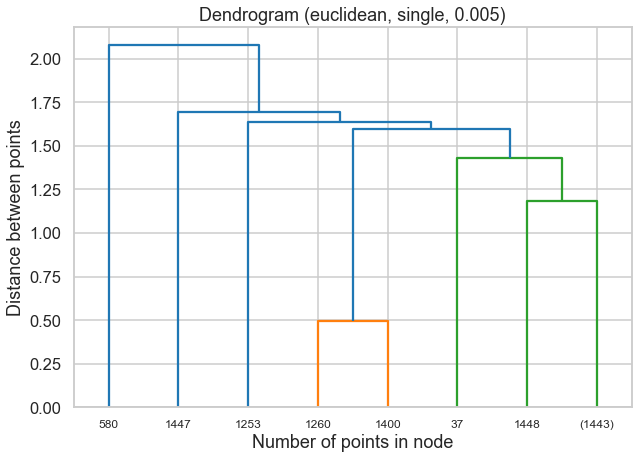

...

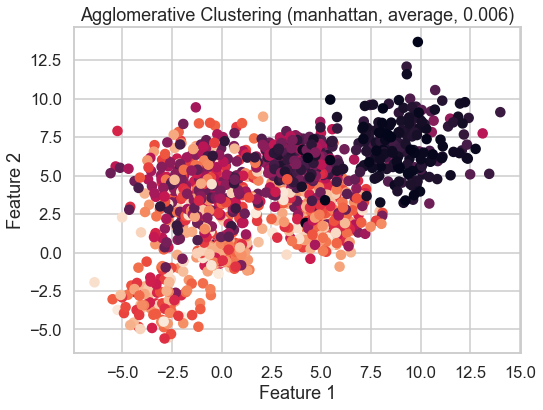

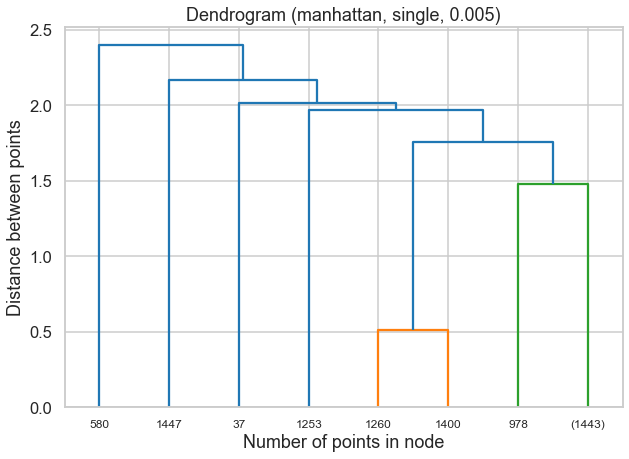

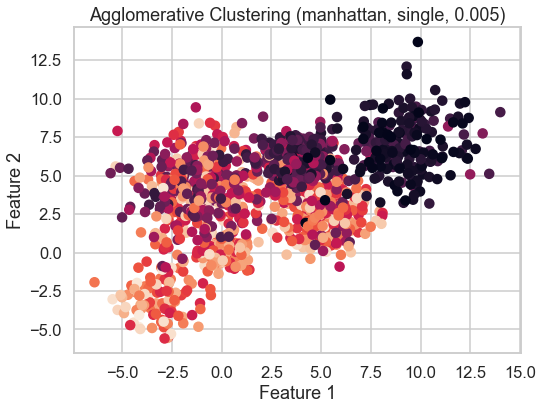

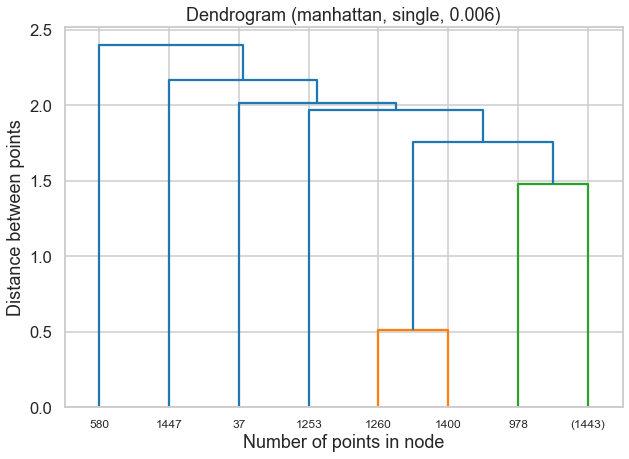

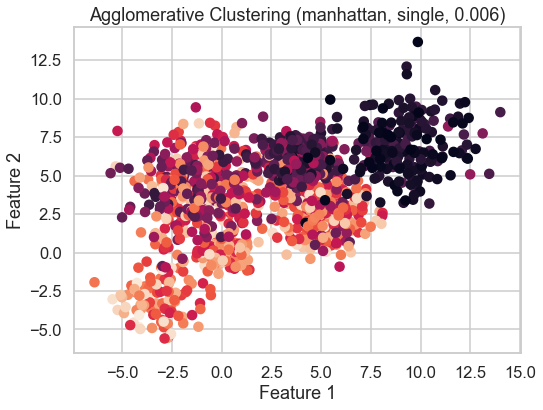

In [73]:
from sklearn.cluster import AgglomerativeClustering

from sklearn.metrics import silhouette_score
from scipy.cluster.hierarchy import dendrogram, linkage
from sklearn.cluster import SpectralClustering
from sklearn.metrics import pairwise_distances



# Agglomerative Clustering with different parameters
affinities = ['euclidean', 'cosine','manhattan']
linkages = ['average', 'single']
dist_thresholds = [0.005, 0.006]

best_score = -1
best_params = {}

for aff in affinities:
    for linkage_type in linkages:
        for dist_threshold in dist_thresholds:
            # fit Agglomerative Clustering model
           
            Clustering_model = AgglomerativeClustering(affinity=aff, linkage=linkage_type, distance_threshold=dist_threshold,n_clusters=None)
            labels = Clustering_model.fit_predict(Multi_blob_Data)
            
           
            # calculate the silhouette score
            score = silhouette_score(Multi_blob_Data, labels)
            
            # check if this score is better than the previous best score
            if score > best_score:
                best_score = score
                best_params = {'affinity': aff, 'linkage': linkage_type, 'distance_threshold': dist_threshold}

            # plot the dendrogram
            plt.figure(figsize=(10, 7))
            if aff == 'manhattan':
                linkage_matrix = linkage(Multi_blob_Data, method=linkage_type, metric='cityblock')
            else:
                linkage_matrix = linkage(Multi_blob_Data, method=linkage_type, metric=aff)

            #linkage_matrix=linkage(Multi_blob_Data,metric=aff,method=linkage_type)
            dend = dendrogram(linkage_matrix, truncate_mode='level', p=5)
            plt.title(f"Dendrogram ({aff}, {linkage_type}, {dist_threshold})")
            plt.xlabel("Number of points in node")
            plt.ylabel("Distance between points")
            #plt.show()

            # plot the resulting clusters
            plt.figure(figsize=(8, 6))
            plt.scatter(Multi_blob_Data[:, 0], Multi_blob_Data[:, 1], c=labels)
            plt.title(f"Agglomerative Clustering ({aff}, {linkage_type}, {dist_threshold})")
            plt.xlabel("Feature 1")
            plt.ylabel("Feature 2")
            #plt.show()
#best_score = max(scores)            
print(f"Best silhouette score: {best_score} with parameters: {best_params}")


### DBScan
* Use DBScan function to  to cluster the above data 
* In the  DBscan change the following parameters 
    * EPS (from 0.1 to 3)
    * Min_samples (from 5 to 25)
* Plot the silhouette_score versus the variation in the EPS and the min_samples
* Plot the resulting Clusters in this case 
* Find the set of paramters that would find result in the best silhouette_score and store this score for later comparison with other clustering techniques. 
* Record your observations and comments 

Best parameters: eps = 1.1 and min_samples = 7
Best silhouette score: 0.4685207355522043


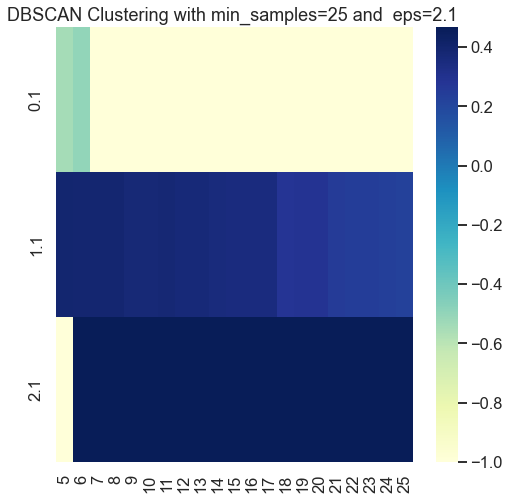

In [76]:
eps_range = np.arange(0.1, 3)
min_samples_range = np.arange(5, 26)
silhouette_scores = []
# Compute silhouette score for all combinations of EPS and min_samples
scores = np.zeros((len(eps_range), len(min_samples_range)))
for i, eps in enumerate(eps_range):
    for j, min_samples in enumerate(min_samples_range):
        dbscan = DBSCAN(eps=eps, min_samples=min_samples)
        labels = dbscan.fit_predict(Multi_blob_Data)
        if len(np.unique(labels)) > 1:
            score = silhouette_score(Multi_blob_Data, labels)
            silhouette_scores.append(score)
        else:
            score = -1
        scores[i, j] = score
        # Plot the resulting clusters
        plt.scatter(Multi_blob_Data[:,0], Multi_blob_Data[:,1], c=labels)
        plt.title(f"DBSCAN Clustering with min_samples={min_samples} and  eps={eps} ")
        plt.xlabel("Feature 1")
        plt.ylabel("Feature 2")
        #plt.show()

# Plot heatmap of silhouette scores
sns.heatmap(scores, xticklabels=min_samples_range, yticklabels=eps_range, cmap="YlGnBu")


# DBSCAN-2

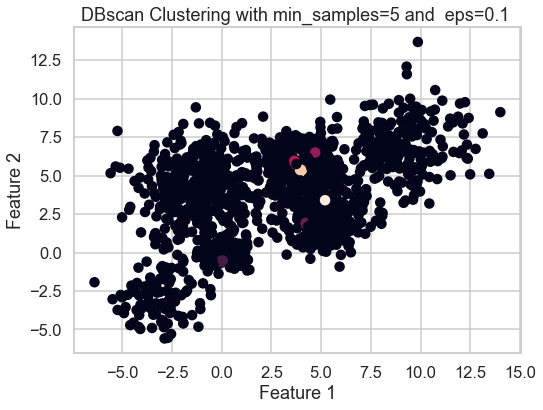

6
1


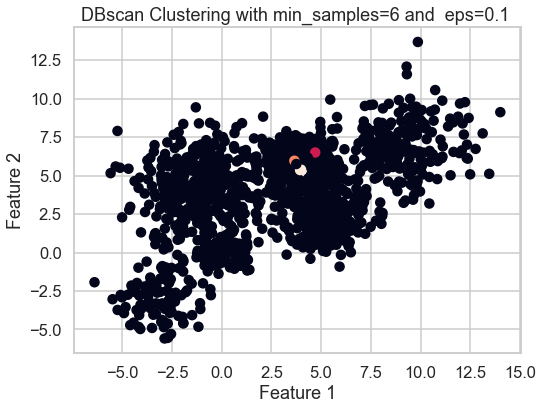

6
2


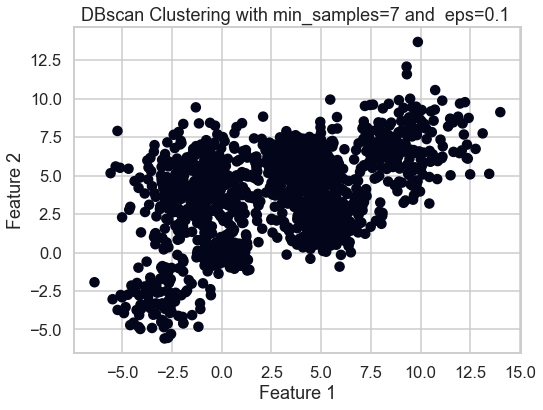

6
2


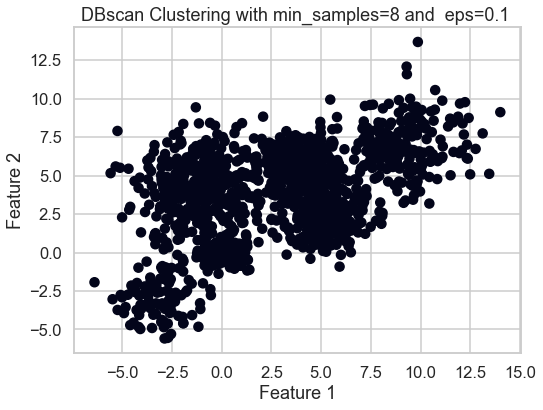

6
2


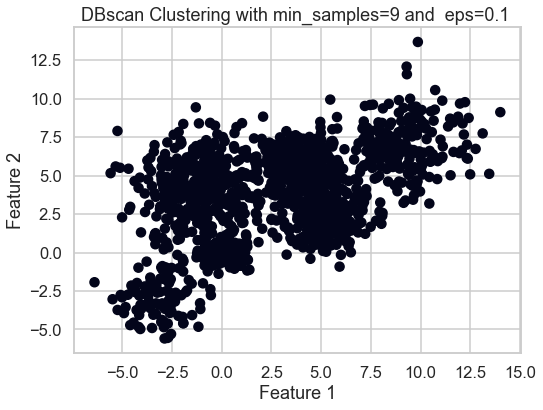

6
2


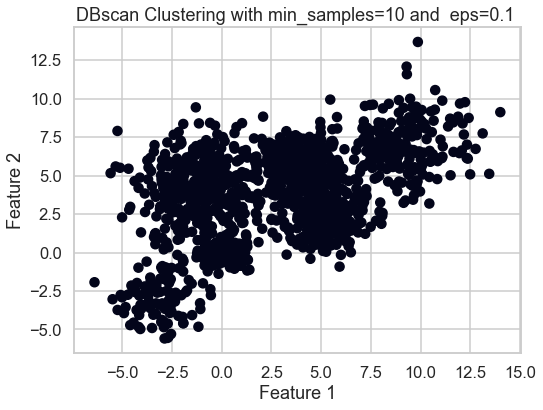

6
2


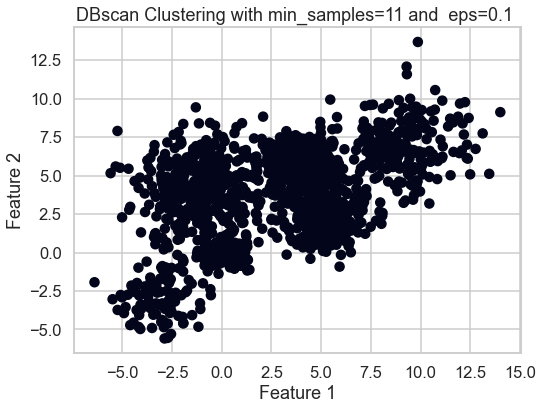

6
2


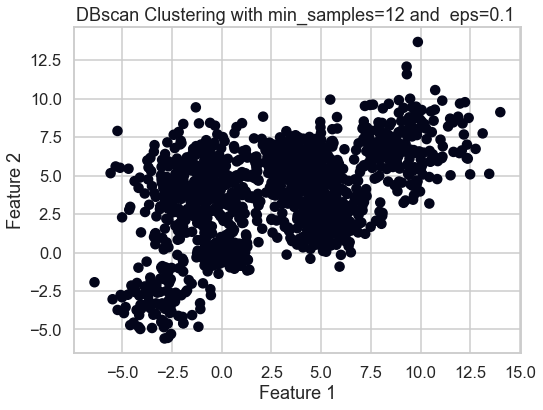

6
2


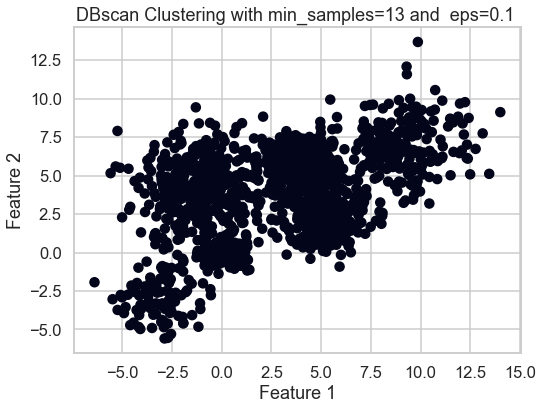

6
2


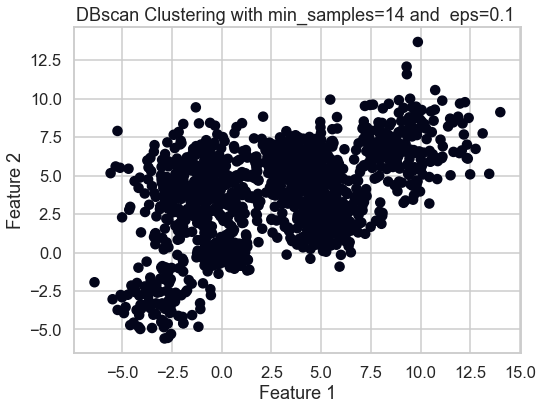

6
2


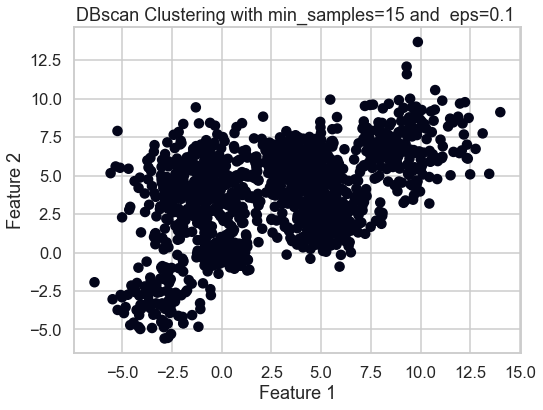

6
2


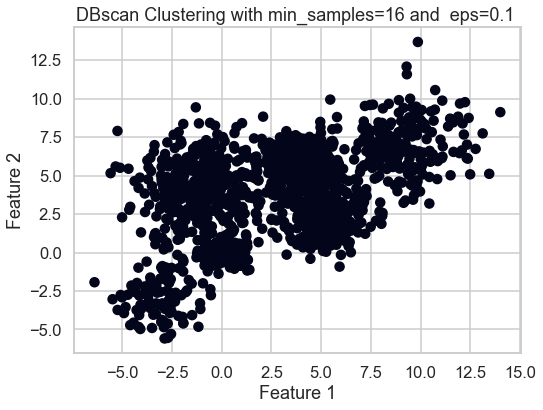

6
2


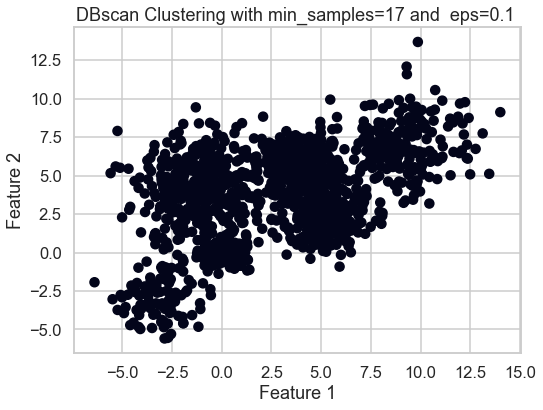

6
2


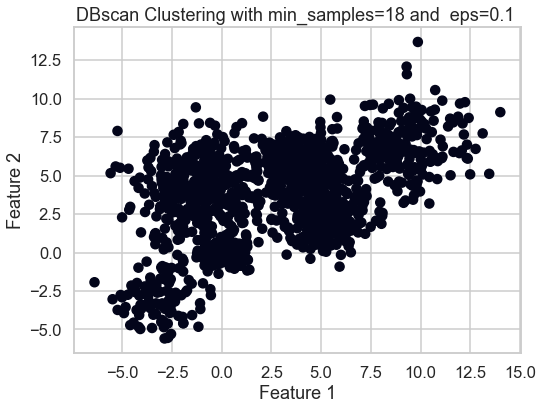

6
2


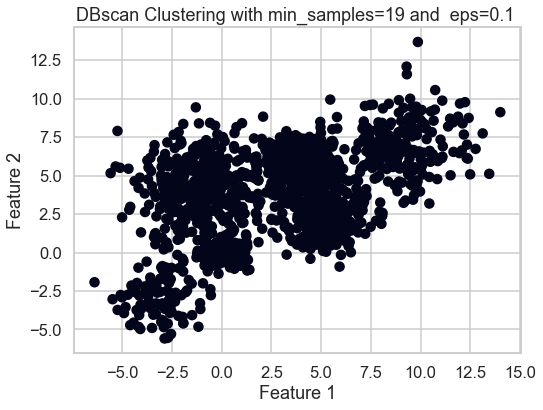

6
2


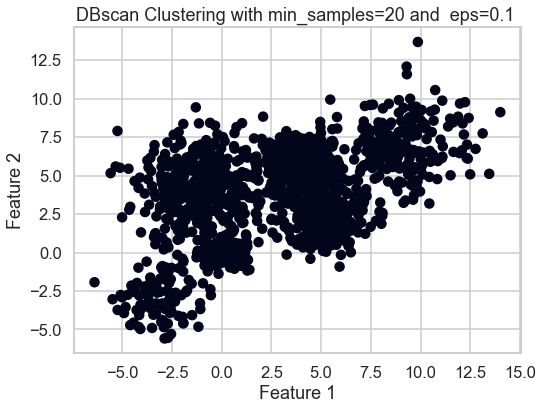

6
2


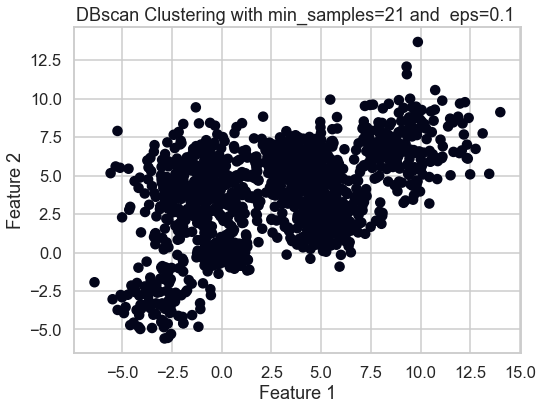

6
2


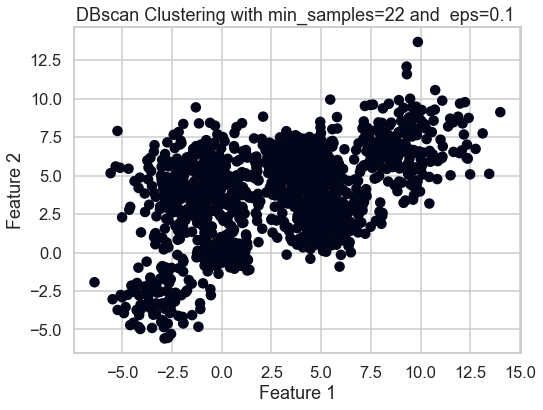

6
2


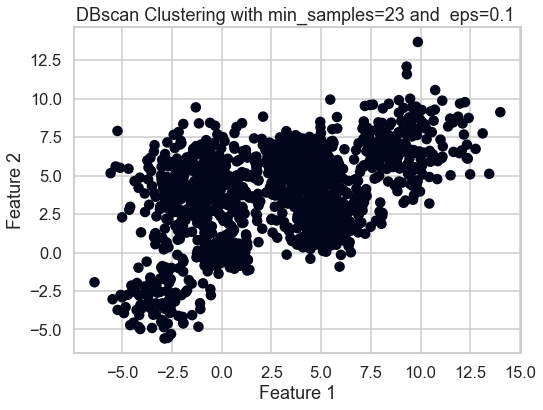

6
2


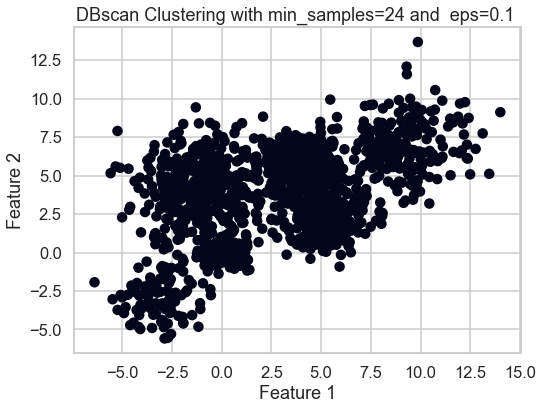

6
2


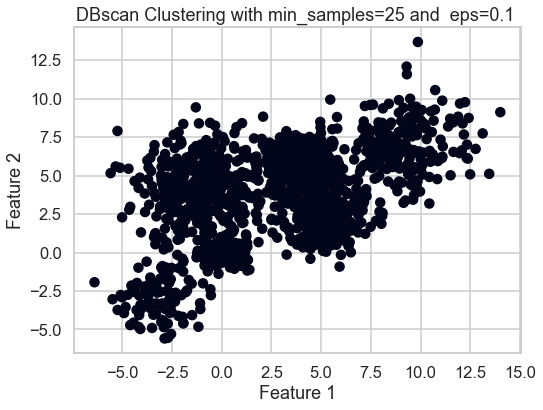

6
2


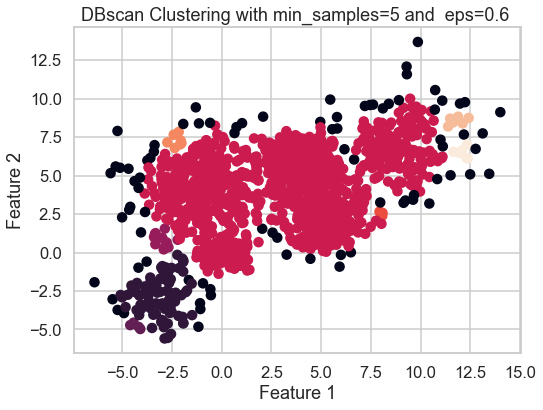

6
3


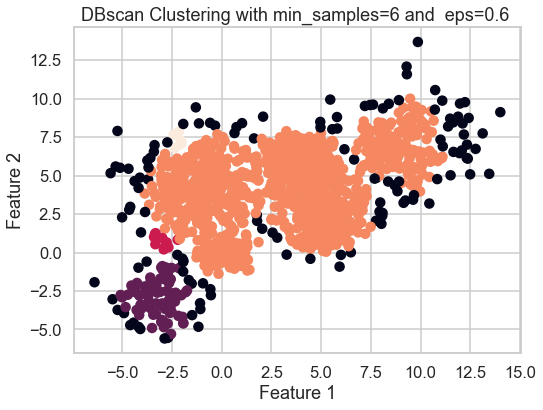

6
4


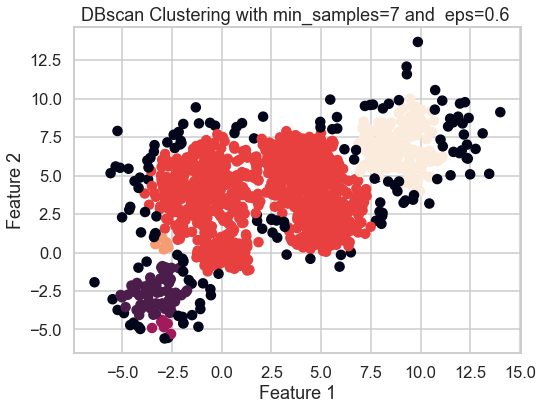

6
5


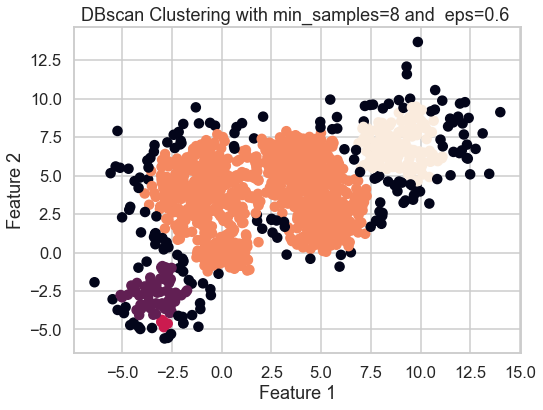

6
6


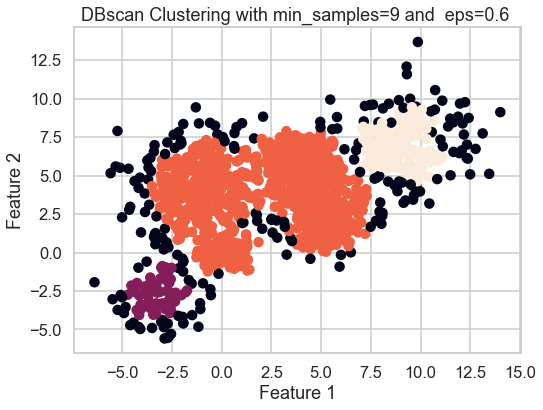

6
7


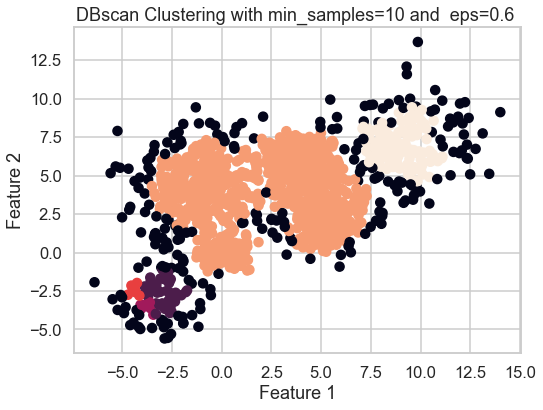

6
8


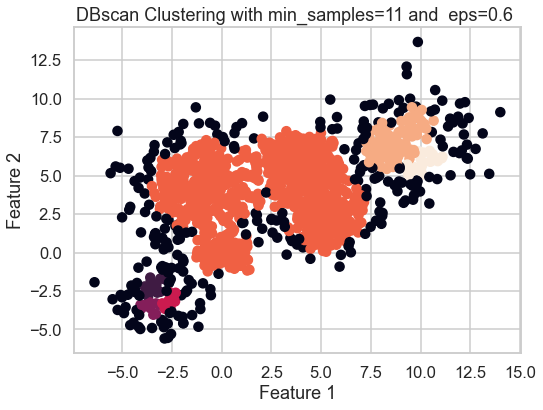

6
9


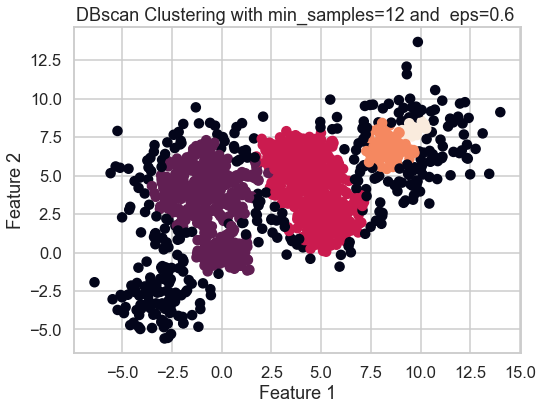

6
10


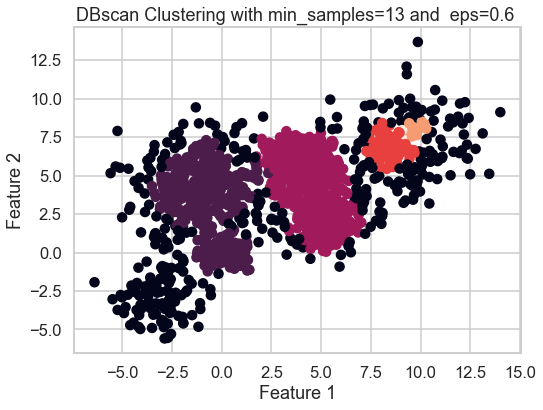

6
11


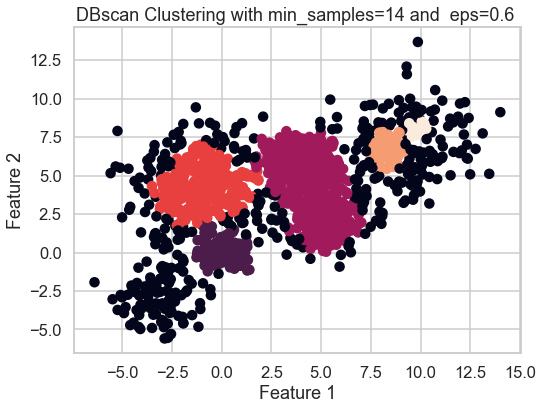

6
12


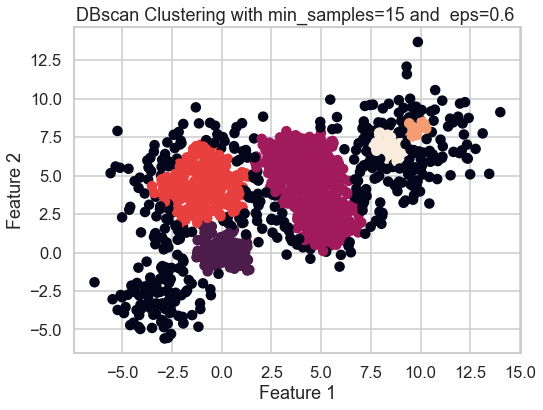

6
13


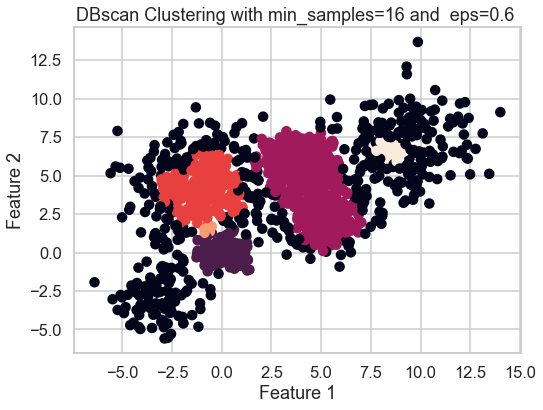

6
14


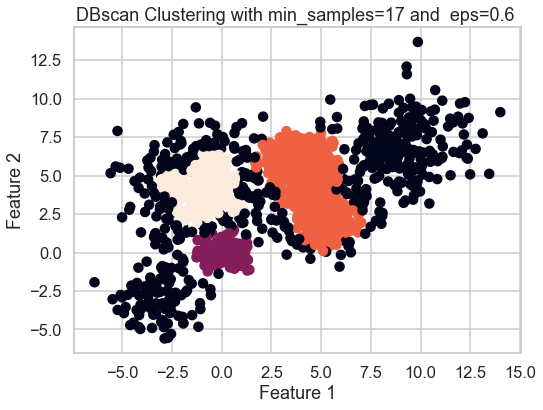

6
15


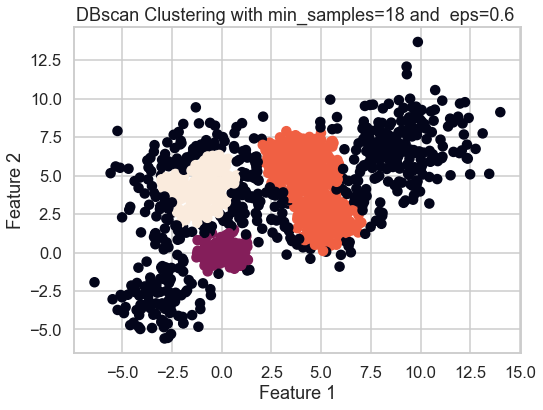

6
16


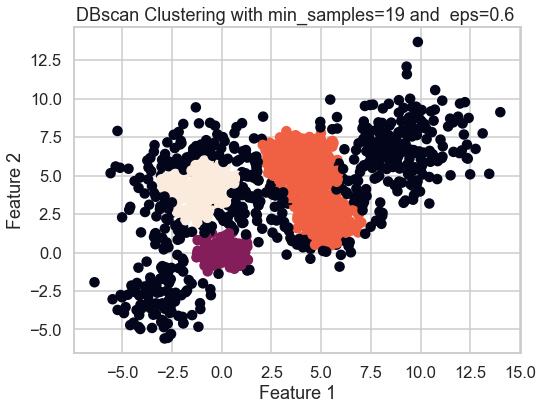

6
17


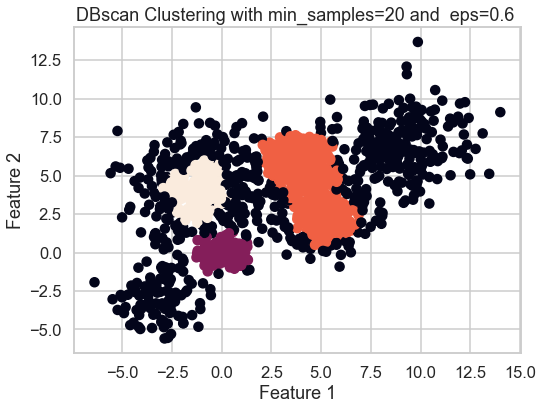

6
18


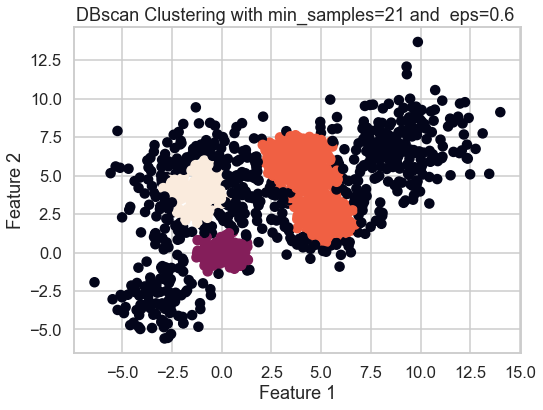

6
19


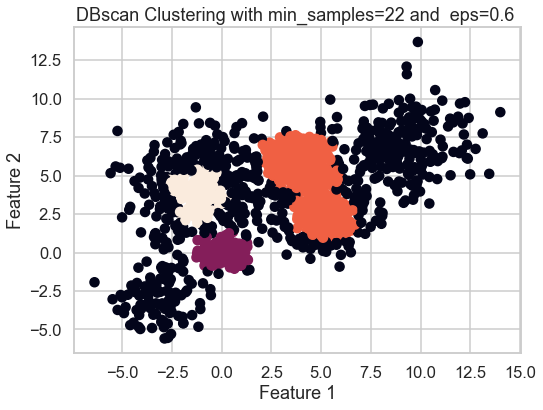

6
20


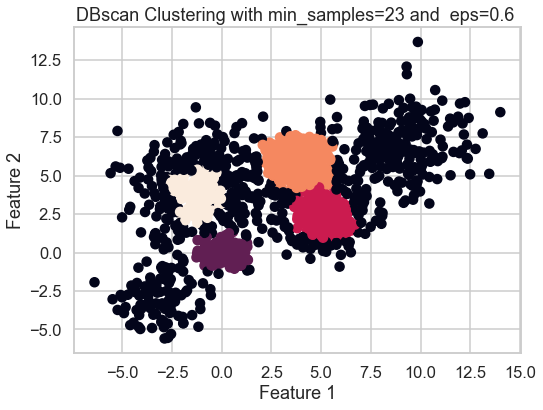

6
21


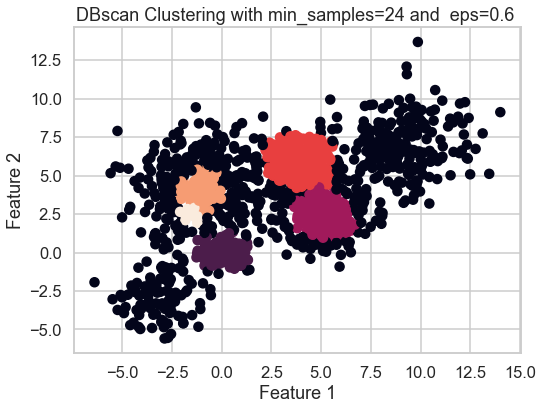

6
22


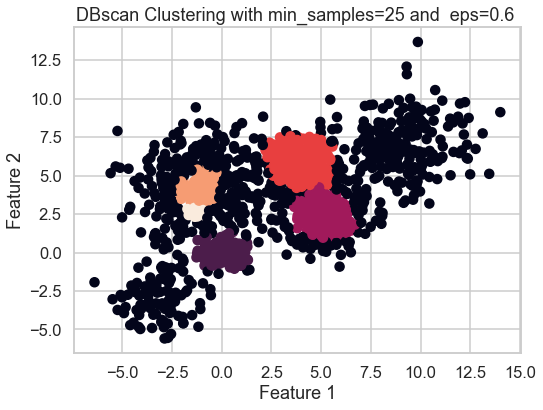

6
23


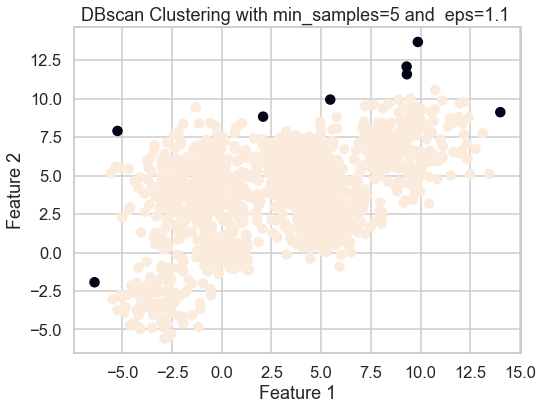

6
24


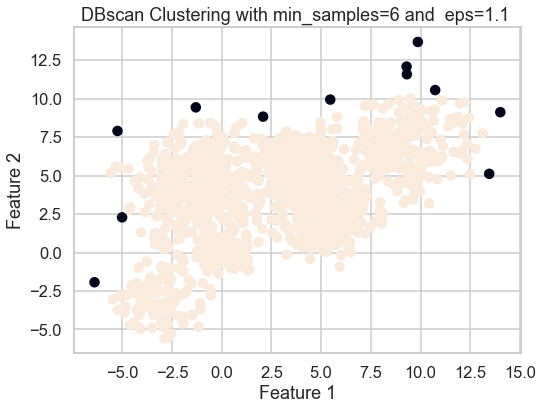

6
25


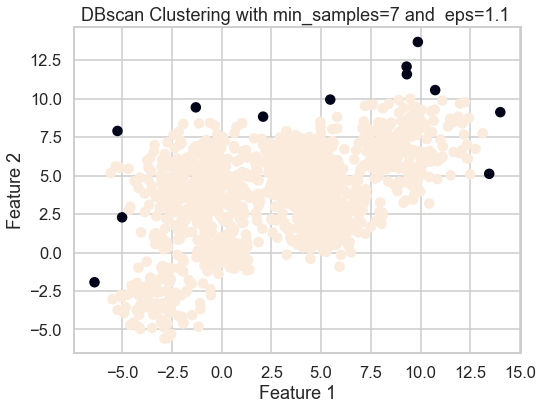

6
26


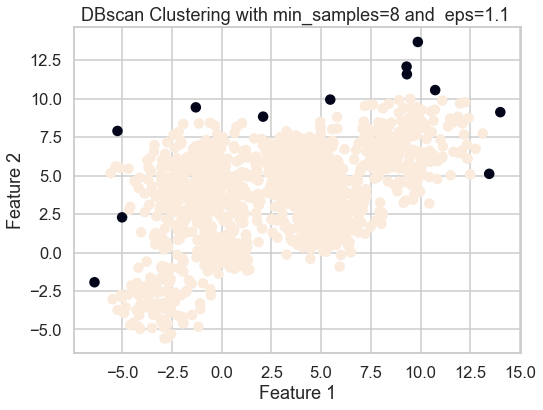

6
27


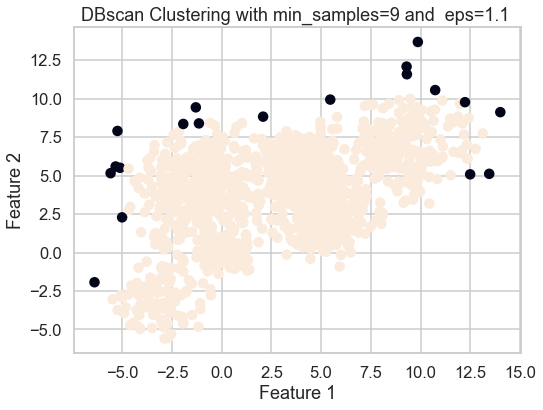

6
28


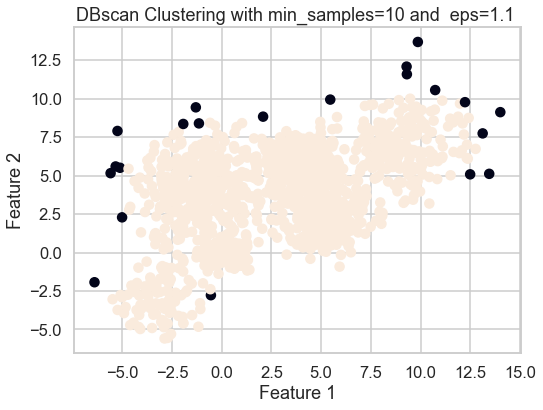

6
29


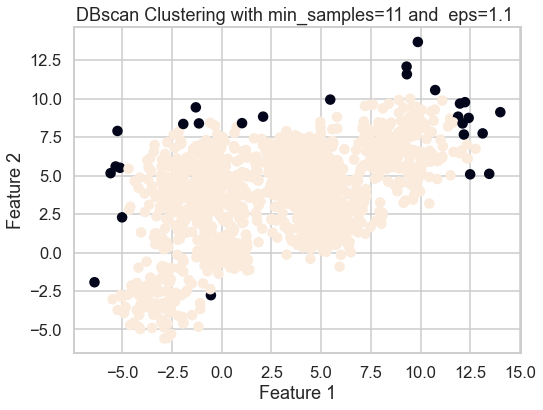

6
30


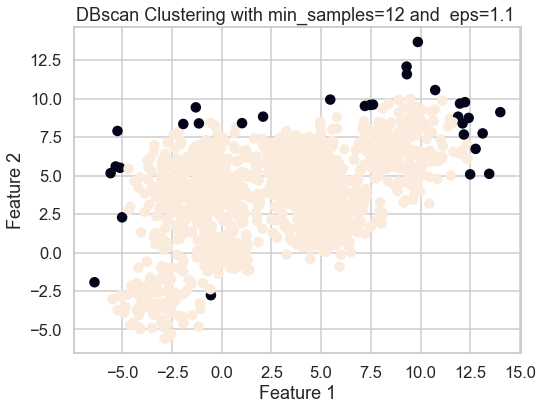

6
31


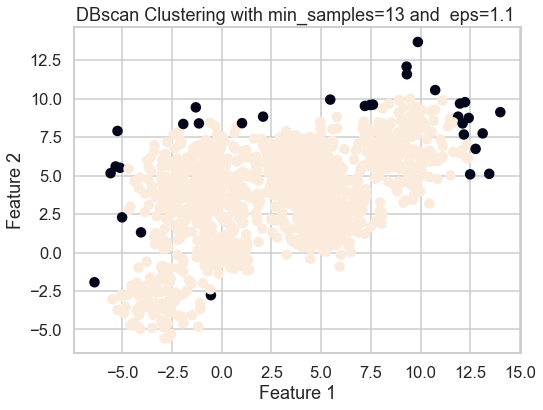

6
32


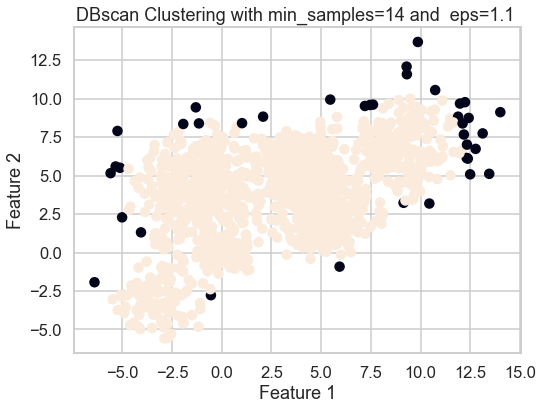

6
33


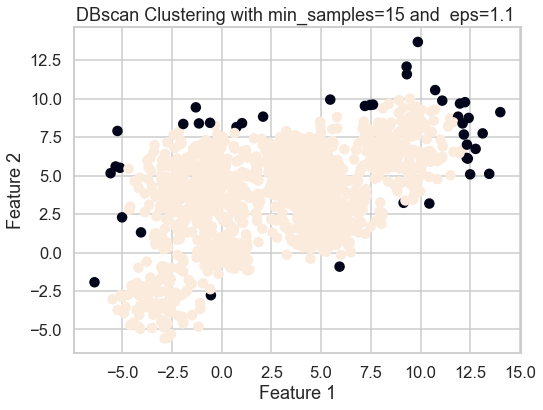

6
34


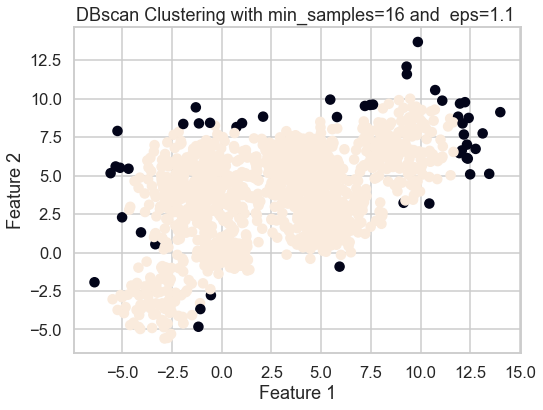

6
35


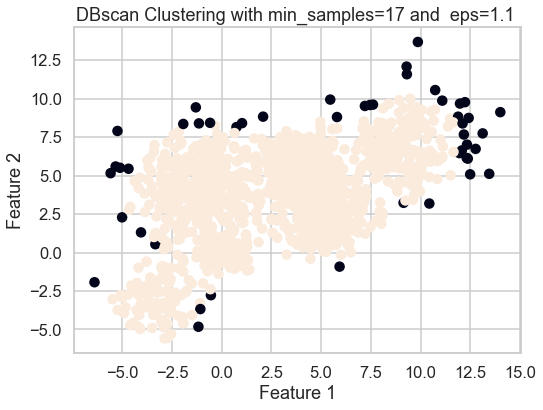

6
36


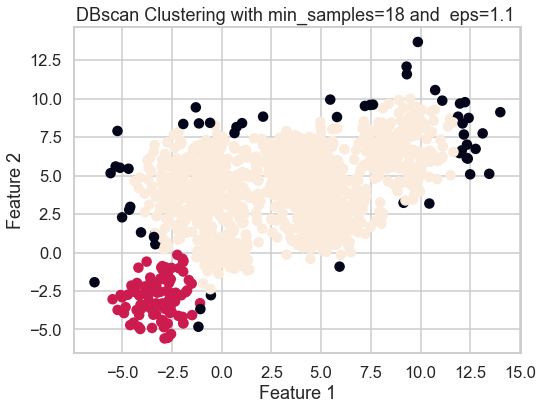

6
37


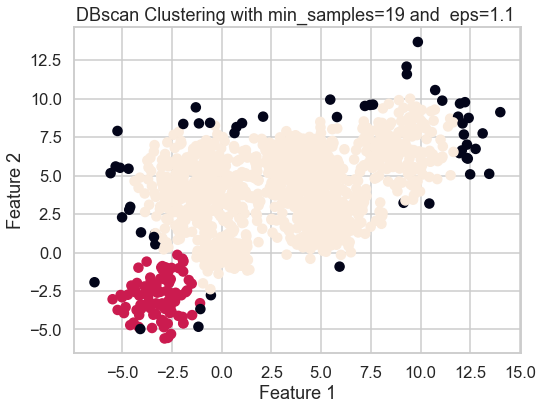

6
38


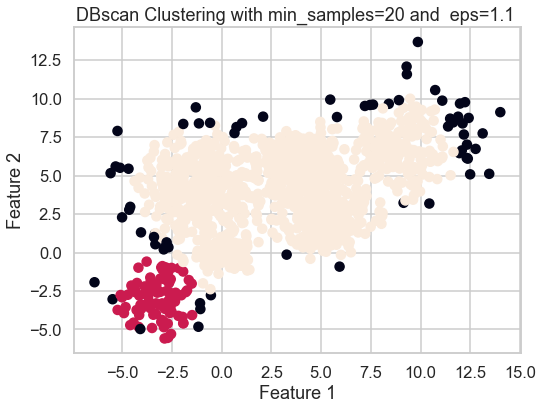

6
39


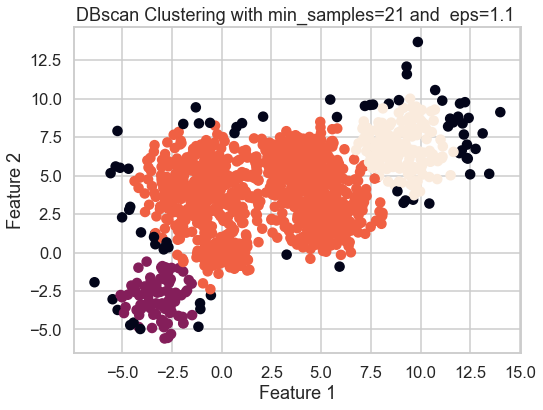

6
40


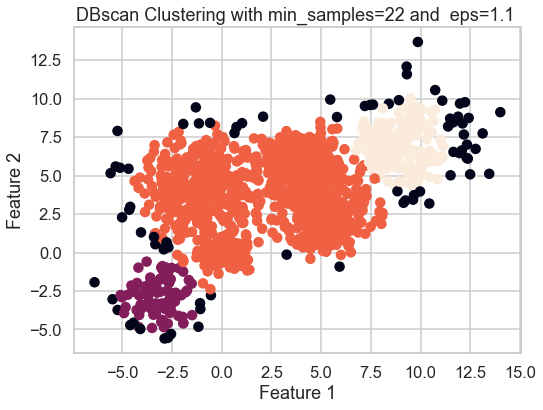

6
41


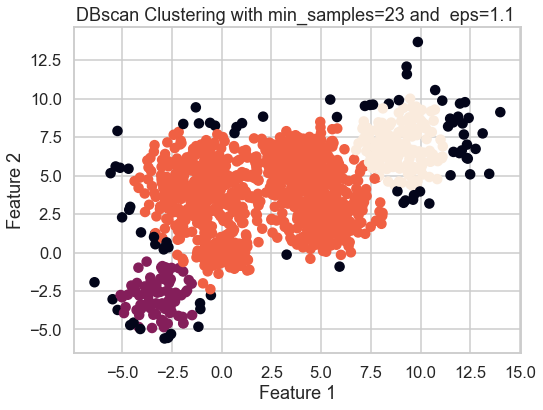

6
42


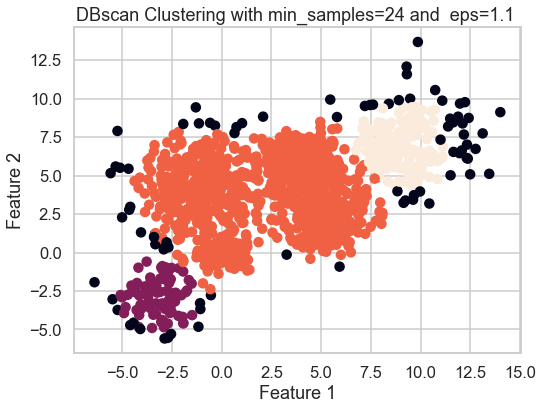

6
43


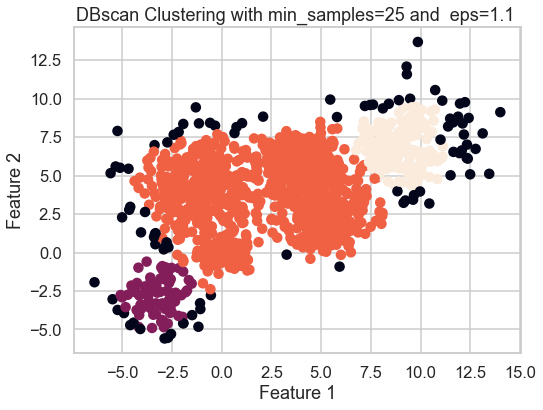

6
44


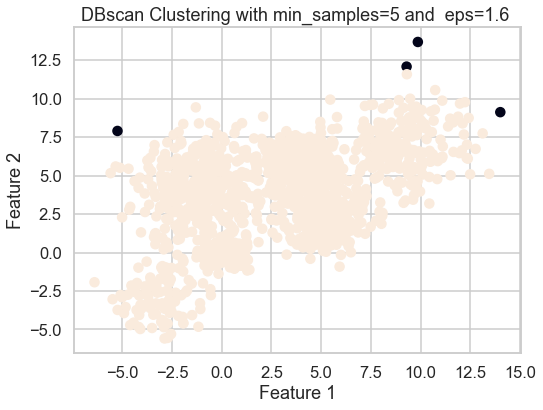

6
45


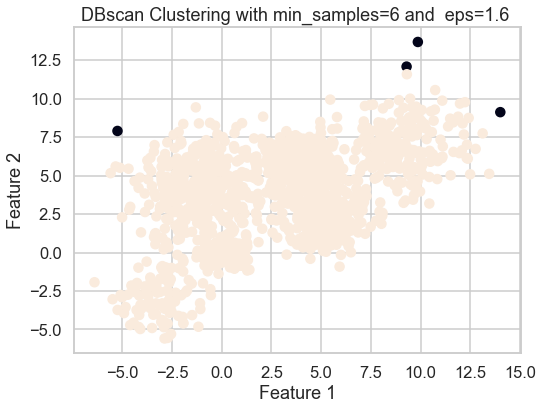

6
46


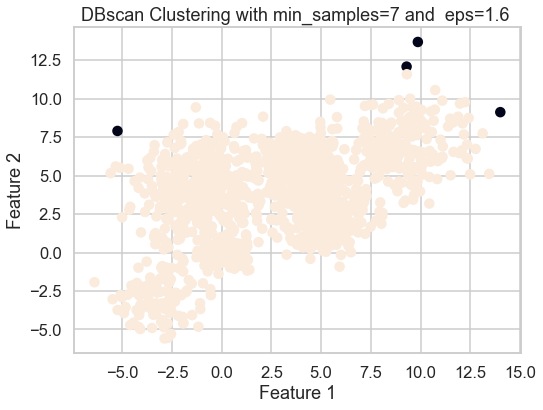

6
47


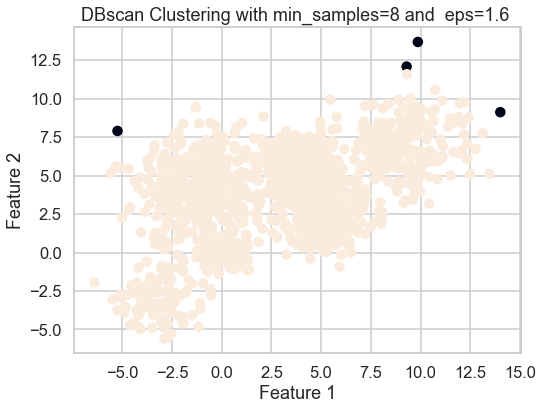

6
48


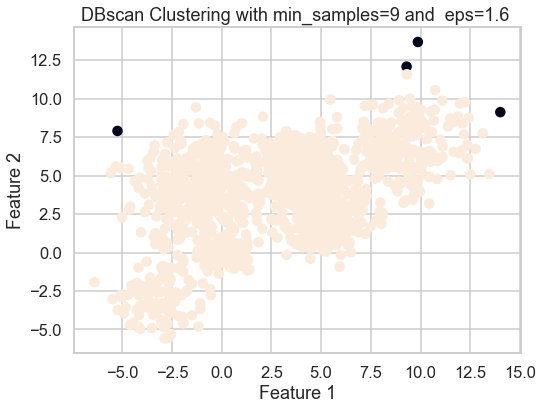

6
49


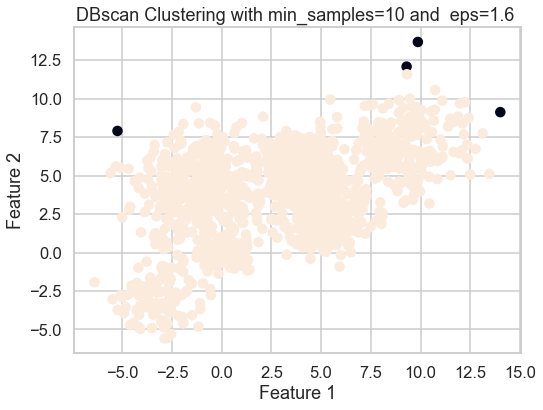

6
50


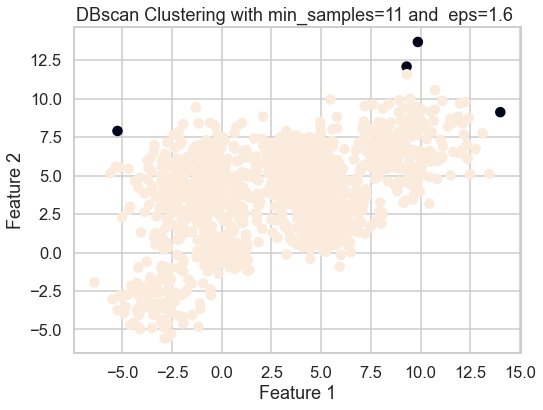

6
51


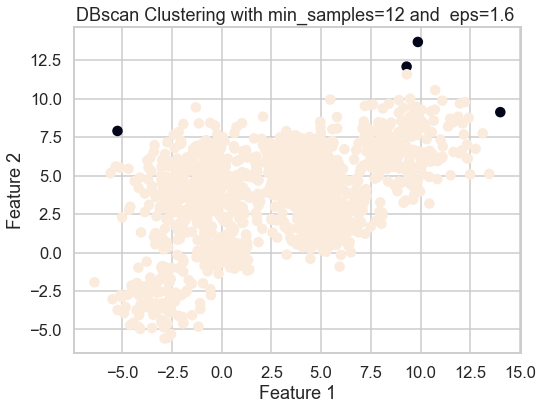

6
52


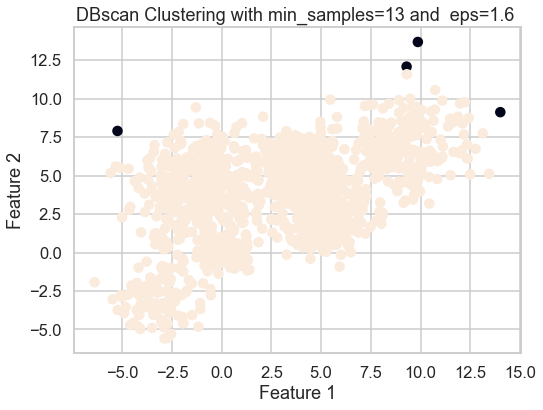

6
53


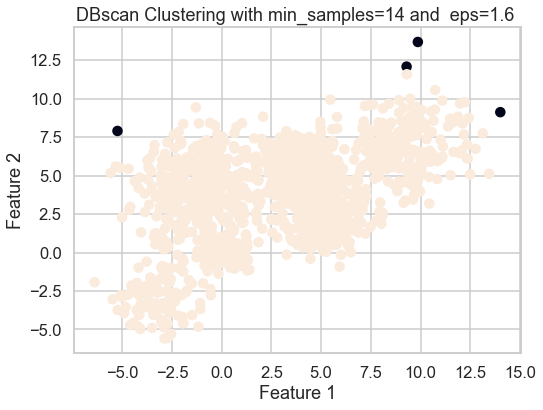

6
54


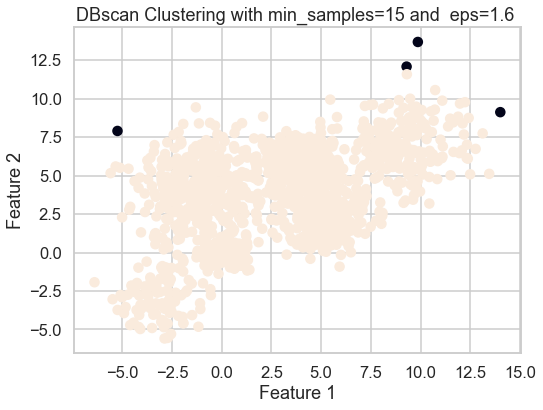

6
55


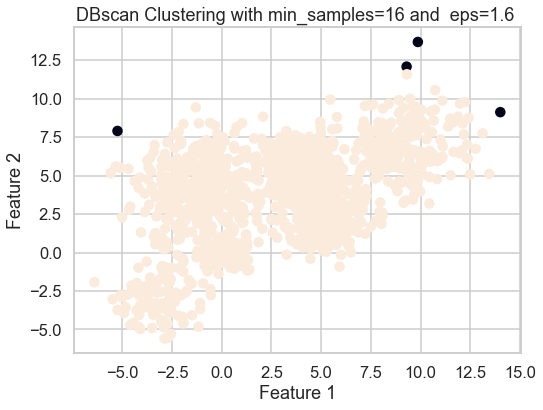

6
56


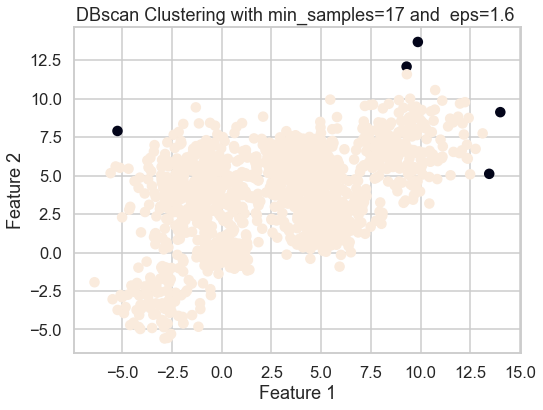

6
57


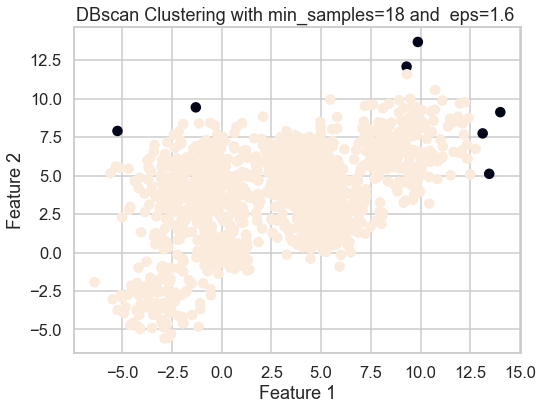

6
58


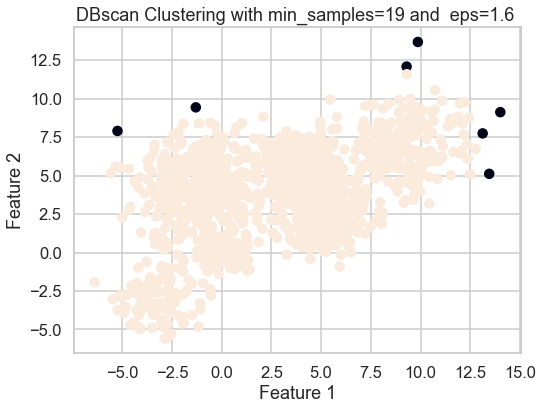

6
59


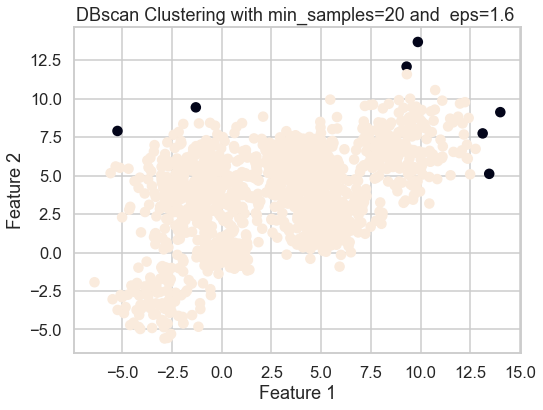

6
60


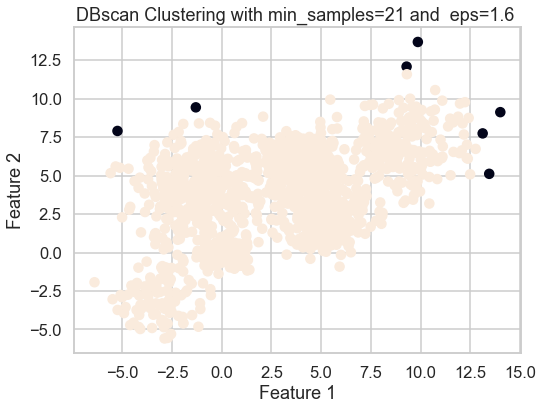

6
61


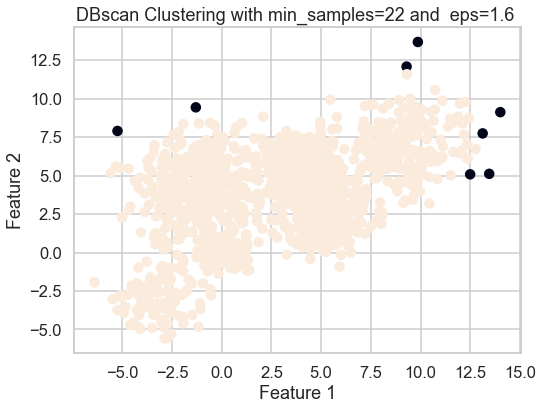

6
62


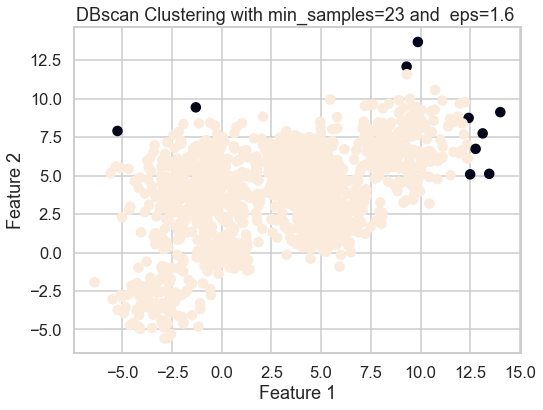

6
63


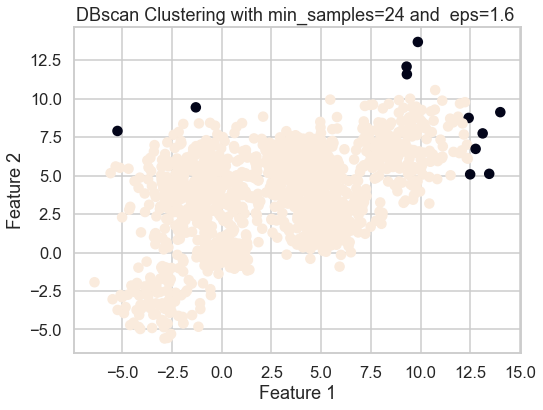

6
64


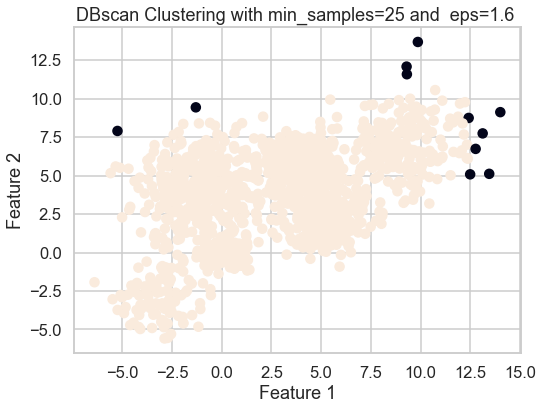

6
65


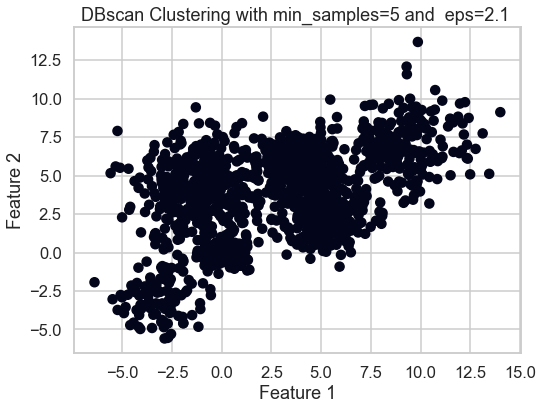

6
65


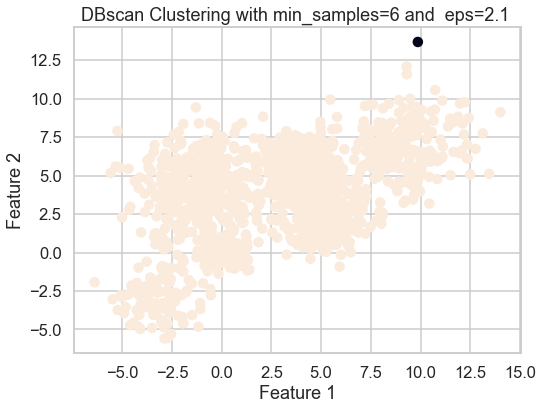

6
66


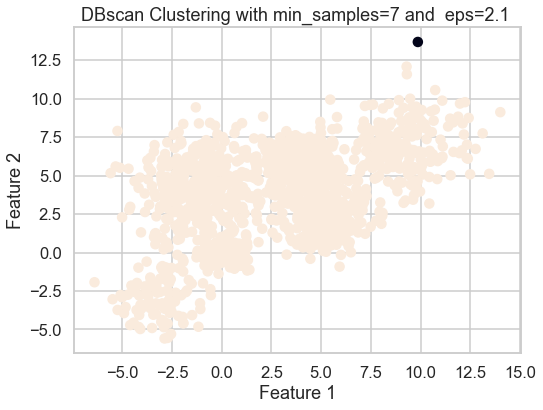

6
67


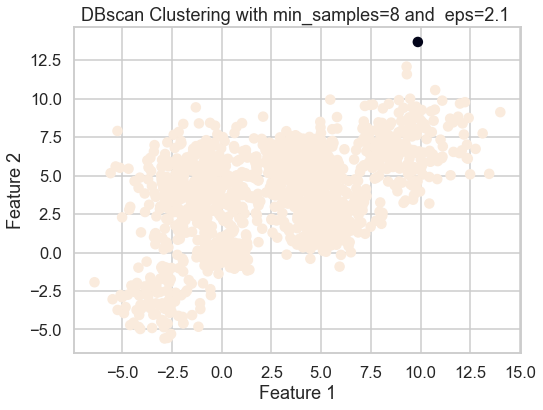

6
68


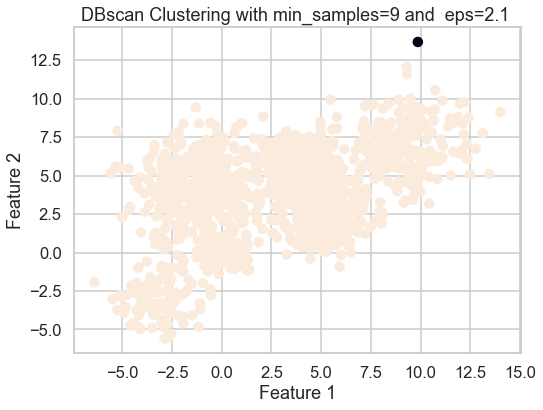

6
69


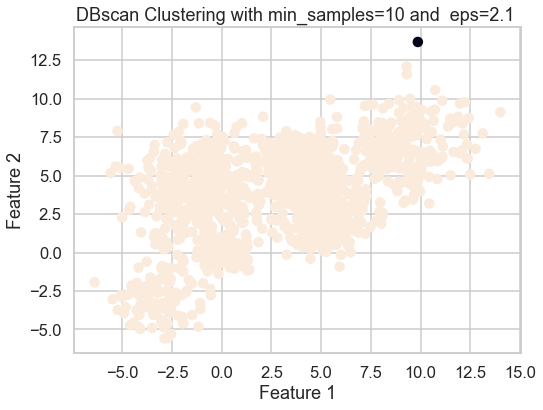

6
70


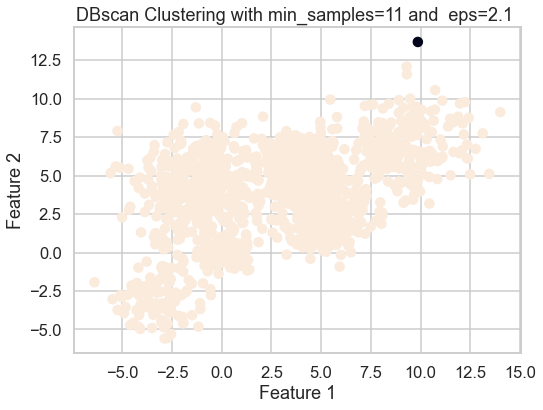

6
71


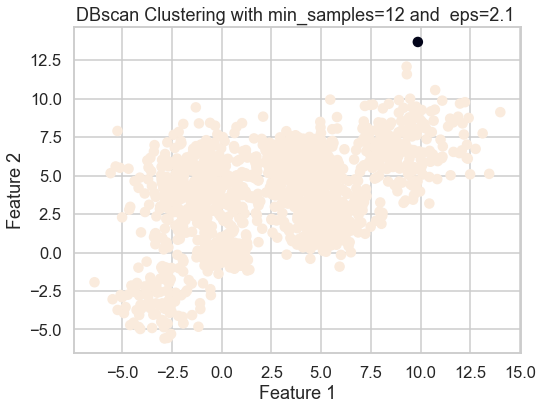

6
72


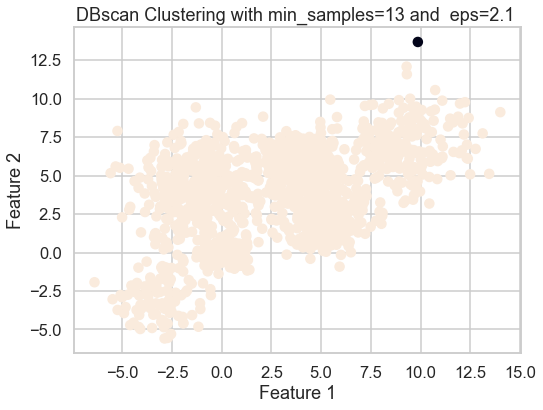

6
73


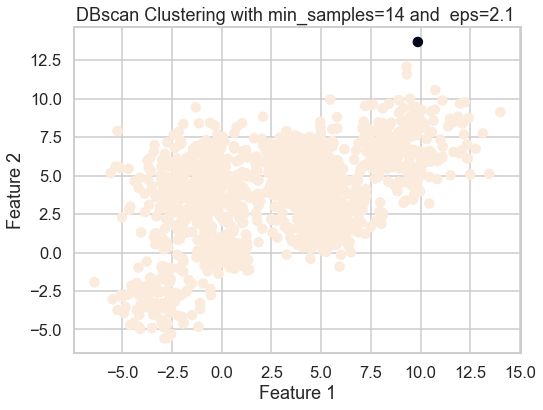

6
74


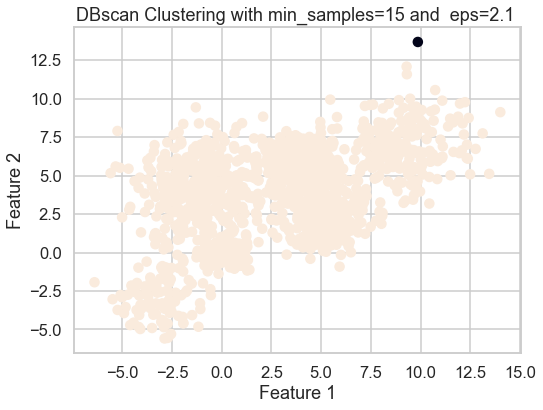

6
75


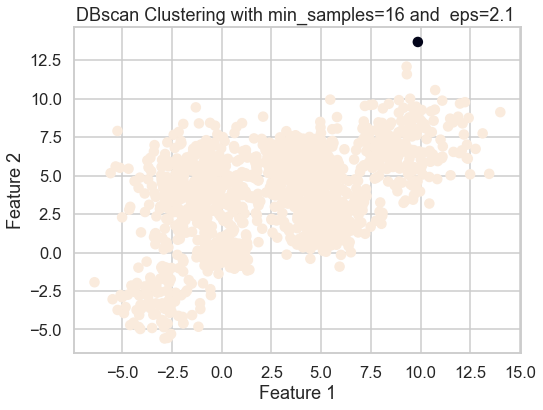

6
76


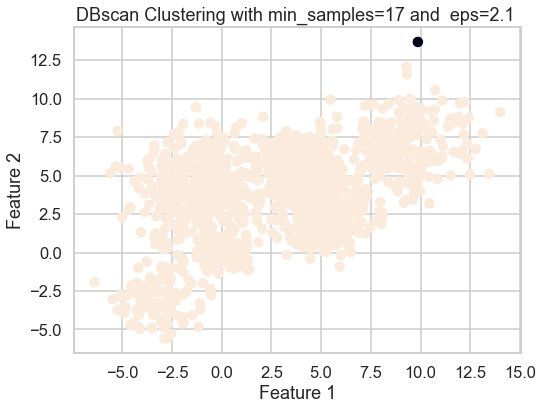

6
77


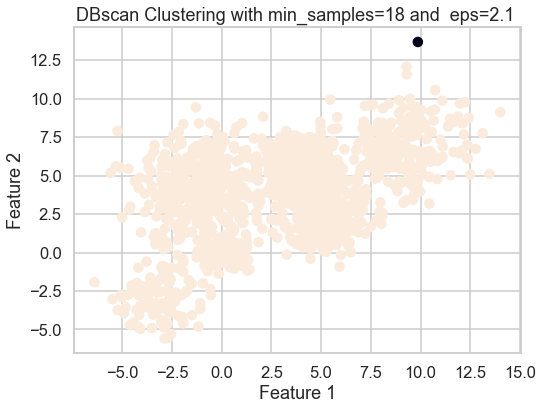

6
78


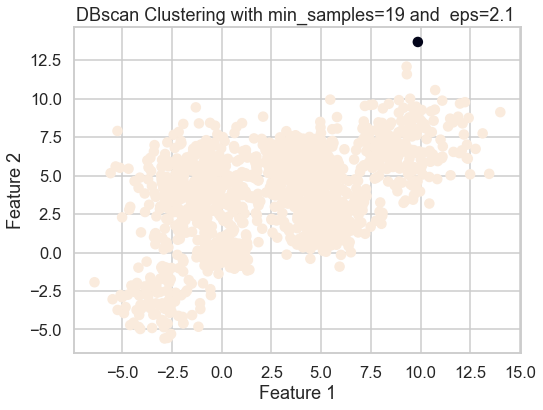

6
79


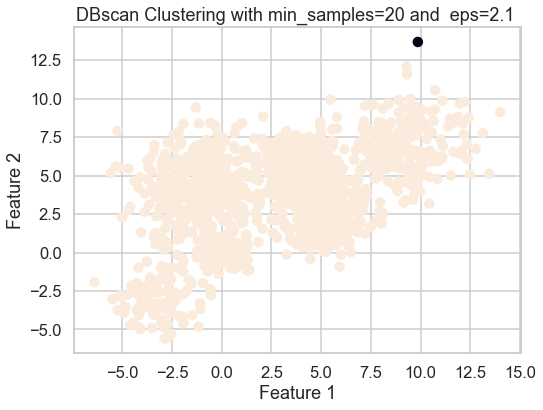

6
80


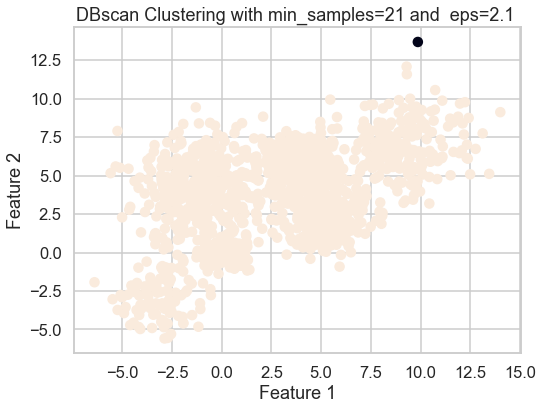

6
81


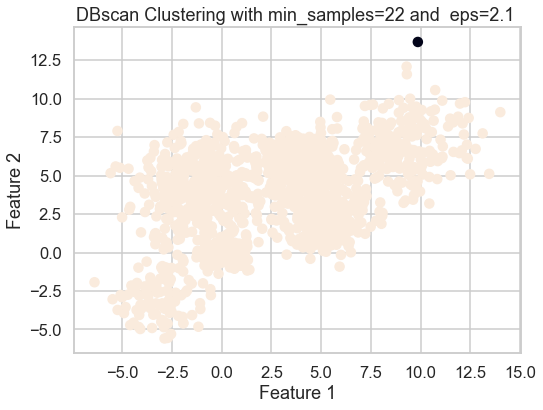

6
82


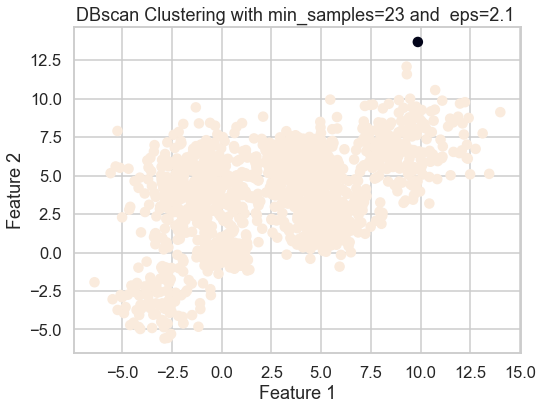

6
83


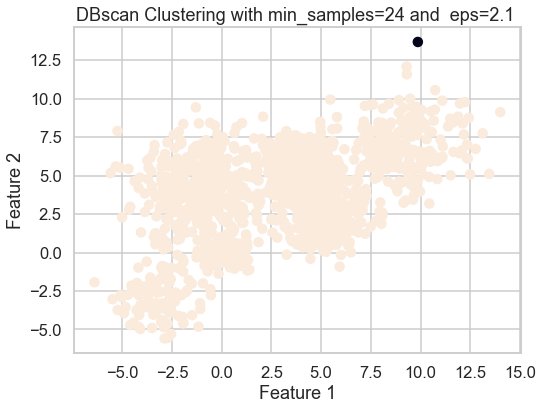

6
84


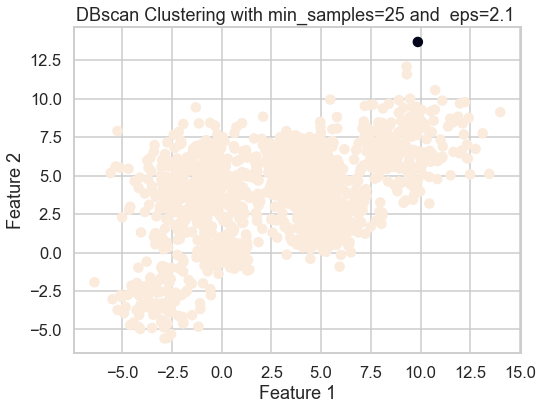

6
85


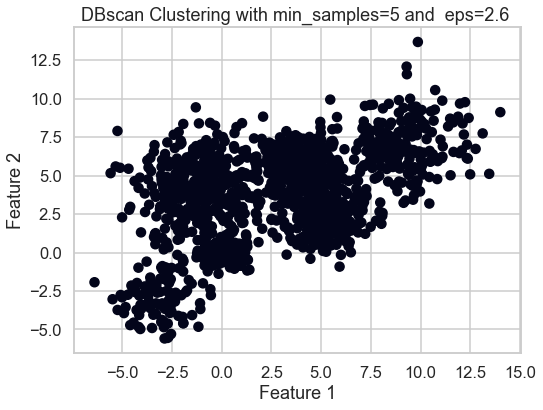

6
85


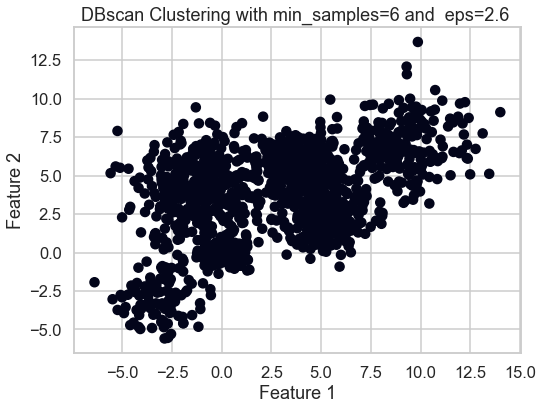

6
85


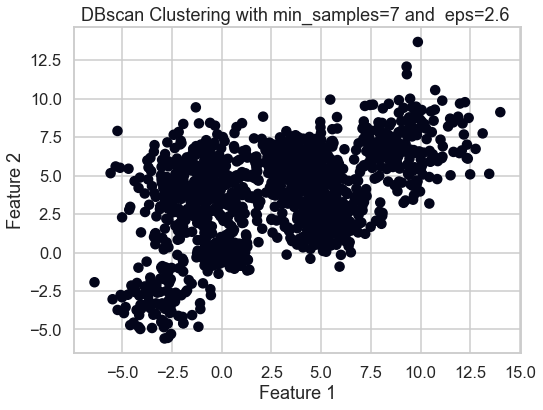

6
85


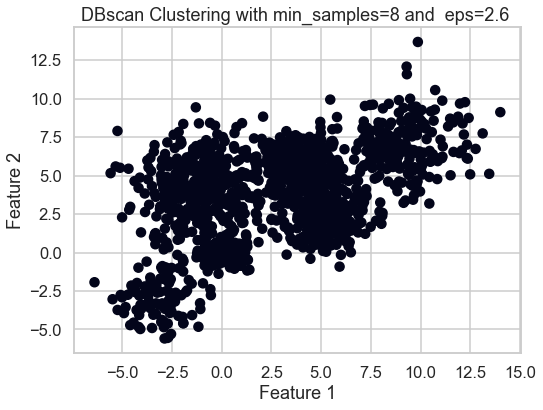

6
85


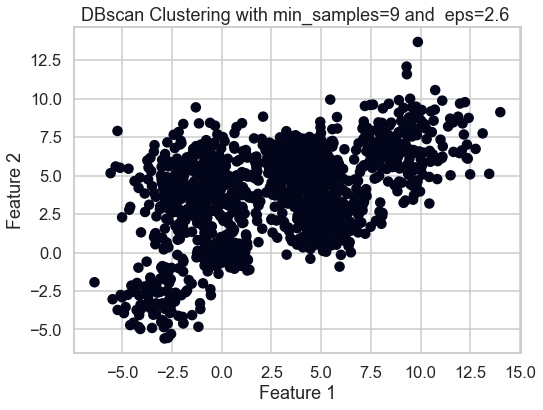

6
85


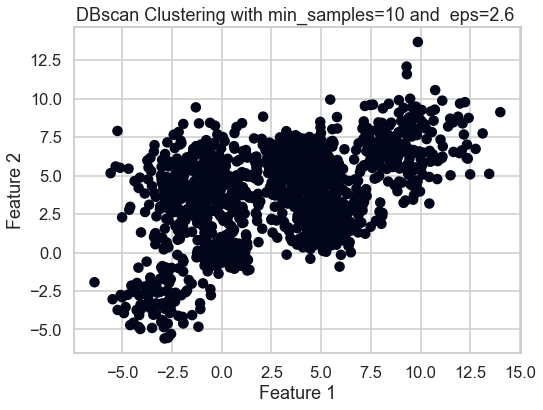

6
85


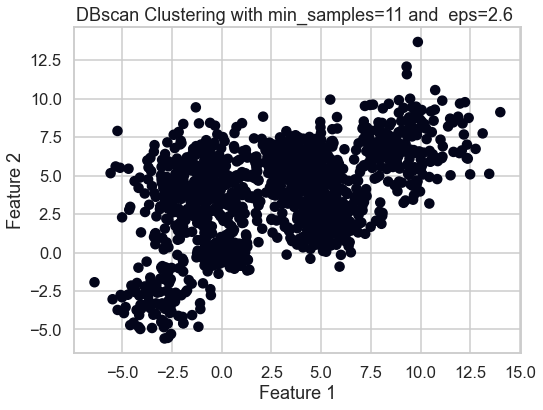

6
85


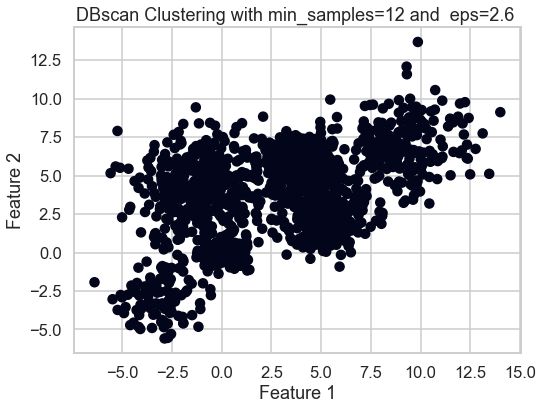

6
85


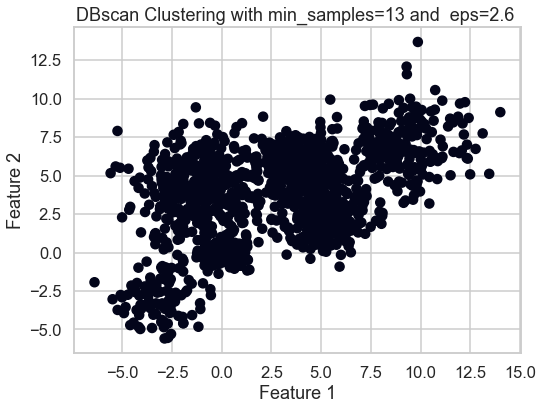

6
85


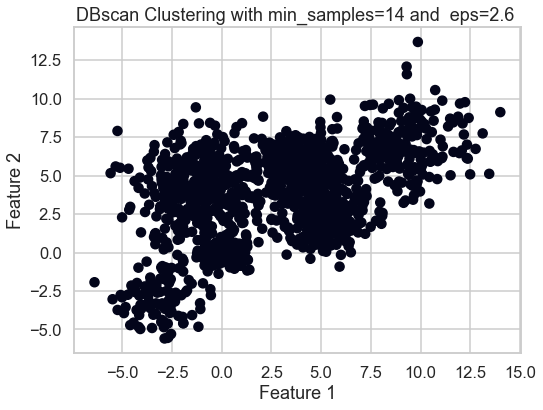

6
85


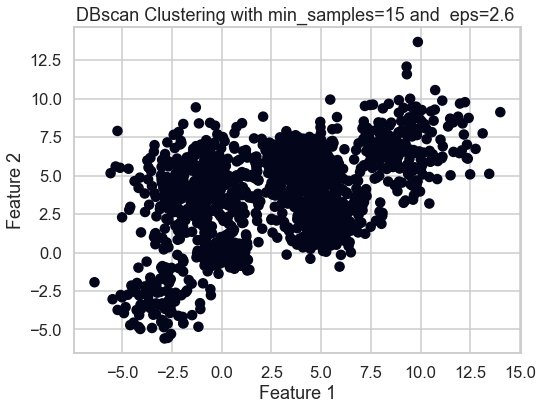

6
85


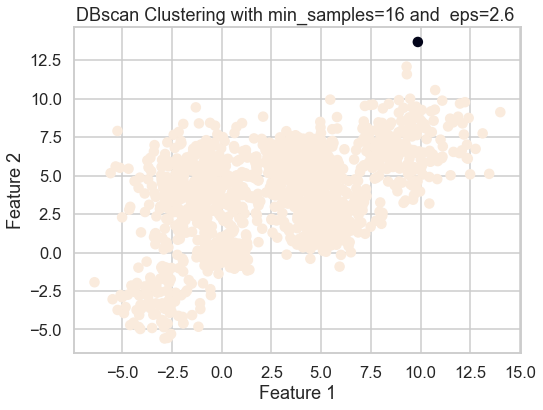

6
86


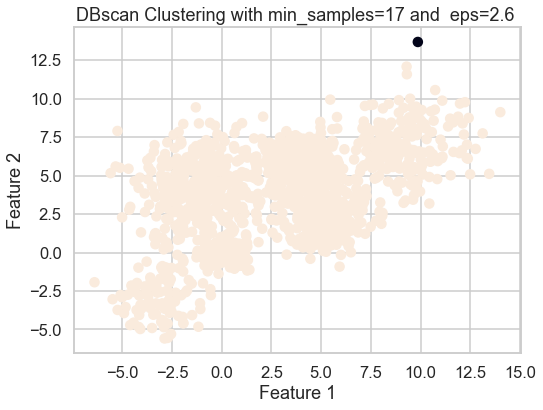

6
87


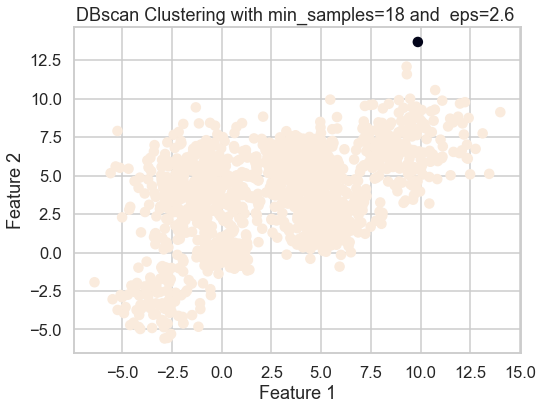

6
88


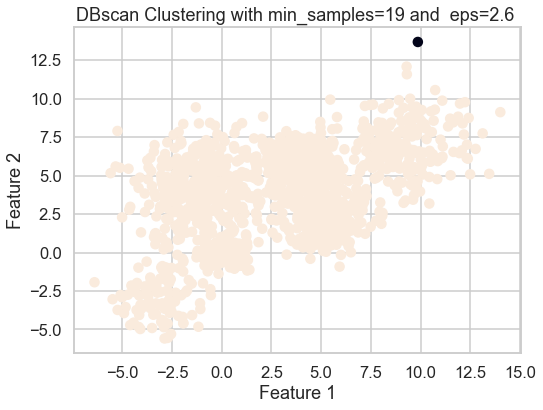

6
89


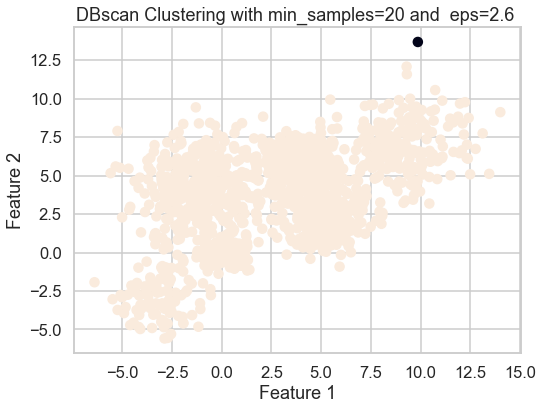

6
90


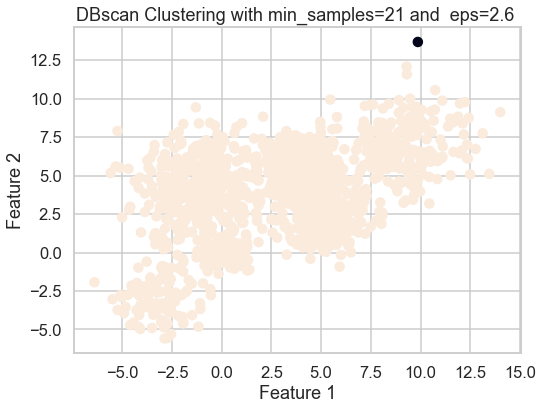

6
91


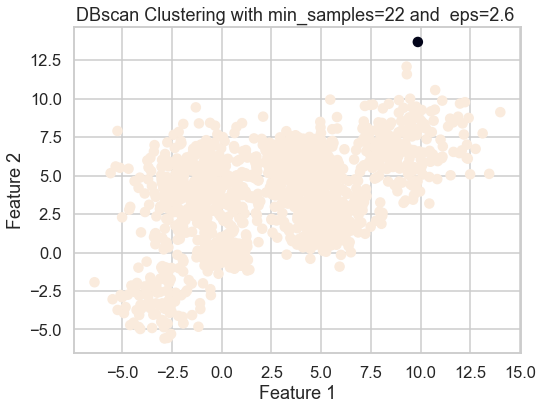

6
92


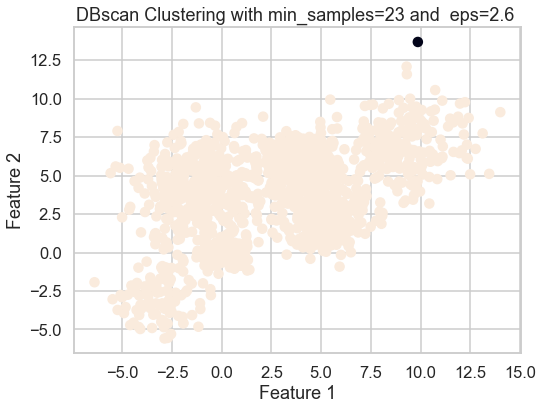

6
93


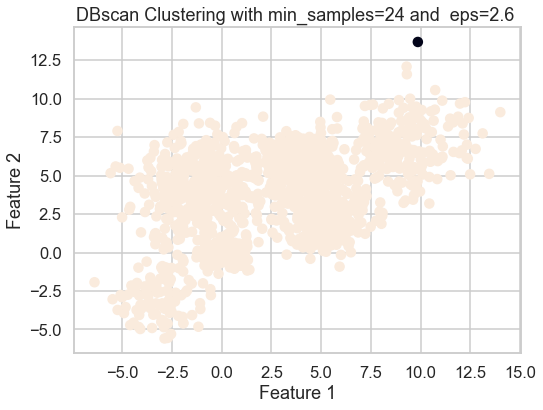

6
94


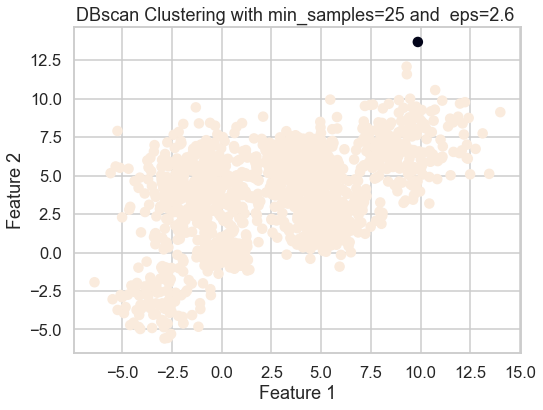

6
95
Best silhouette score: 0.4685207355522043 with parameters: {'The value of the Epsilon': 2.6, 'The min_Samples': 25}


In [28]:
eps_range = np.arange(0.1,3.1,0.5)
min_samples_range = np.arange(5, 26)
silhouette_scores=[]
for eps in eps_range:
    for min_sample in min_samples_range:
        DB=DBSCAN(eps=eps,min_samples=min_sample)
        labels=DB.fit_predict(Multi_blob_Data)
        #labels = DB.labels_
        if len(np.unique(labels)) > 1:
            score = silhouette_score(Multi_blob_Data, labels)
            silhouette_scores.append(score)
        else:
            silhouette_scores.append(None)
            score = -1    
            
        # check if this score is better than the previous best score
        best_score=-1
        best_params={}
        
        if score > best_score:
            best_score = score
            best_params={'The value of the Epsilon': eps,'The min_Samples' :min_sample }
            #print(eps,min_sample,score)
            
        plt.figure(figsize=(8, 6))
        plt.scatter(Multi_blob_Data[:,0], Multi_blob_Data[:,1], c=labels)
        plt.title(f"DBscan Clustering with min_samples={min_sample} and  eps={eps} ")
        plt.xlabel("Feature 1")
        plt.ylabel("Feature 2")
        plt.show()
        # Remove the missing values (i.e., the -1 values) from the scores list
        silhouette_scores = [s for s in  silhouette_scores if s is not None]
        # Plot the silhouette score versus EPS for this Min_samples value
        #print(len(eps_range))
        #print(len(silhouette_scores))
        #print(eps_range)
        #print(silhouette_scores)
        
        
#best_score = max(silhouette_scores)
print(f"Best silhouette score: {best_score} with parameters: {best_params}")


# Commnets:
from eps=3.0000 and min_sample=[6,25] the silhouette score is the same value for different number of samples

### Gaussian Mixture
* Use GaussianMixture function to cluster the above data 
* In GMM change the covariance_type and check the difference in the resulting proabability fit 
* Use a 2D contour plot to plot the resulting distribution (the components of the GMM) as well as the total Gaussian mixture 

## iris data set 
The iris data set is test data set that is part of the Sklearn module 
which contains 150 records each with 4 features. All the features are represented by real numbers 

The data represents three classes 


In [11]:
from sklearn.datasets import load_iris
iris_data = load_iris()
iris_data.target[[10, 25, 50]]
#array([0, 0, 1])
list(iris_data.target_names)
['setosa', 'versicolor', 'virginica']


['setosa', 'versicolor', 'virginica']

In [ ]:
iris = load_iris()
X = iris.data
K_range = [2, 3, 4, 5, 6, 7, 8, 9, 10]
distortions = []
silhouette_scores = []
    for k in k_range:
        kmeans = KMeans(n_clusters=k, random_state=0)
        kmeans.fit(X)
        distortions.append(kmeans.inertia_)
        score = silhouette_score(X, kmeans.labels_)
        silhouette_scores.append(score)
        print("For k =", k, ", number of samples in each cluster:", np.bincount(kmeans.labels_))
   


* Repeat all the above clustering approaches and steps on the above data 
* Normalize the data then repeat all the above steps 
* Compare between the different clustering approaches 

## Customer dataset
Repeat all the above on the customer data set 

# K-means 

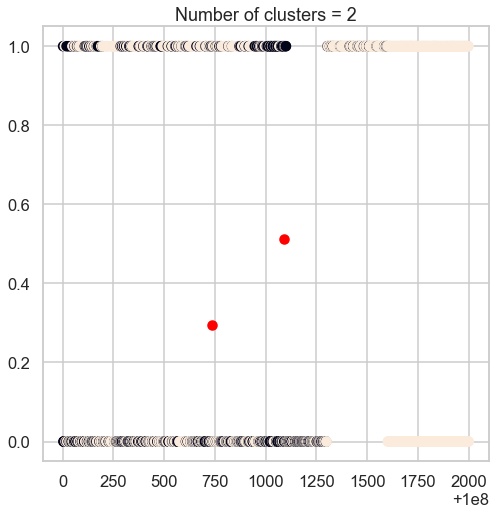

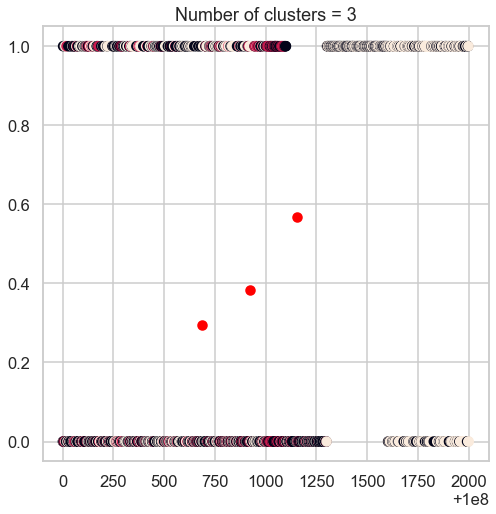

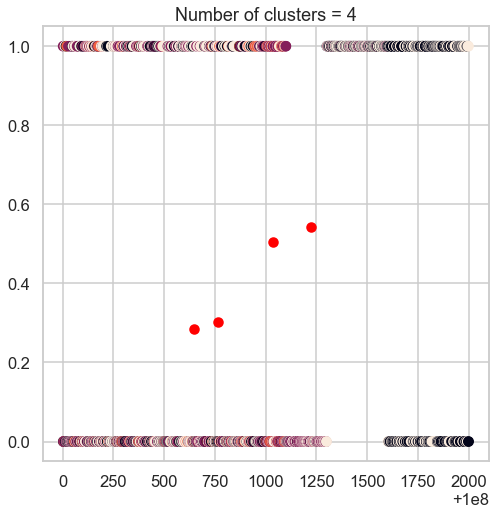

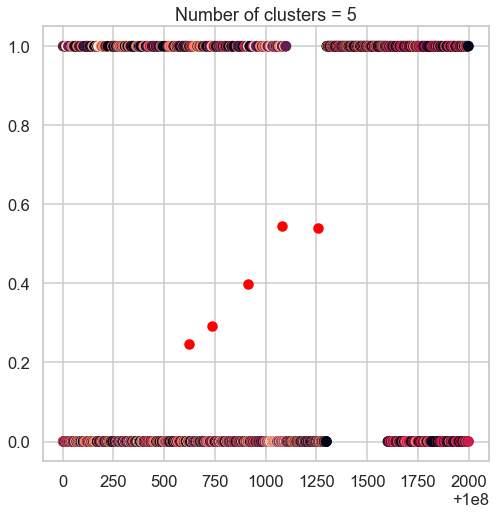

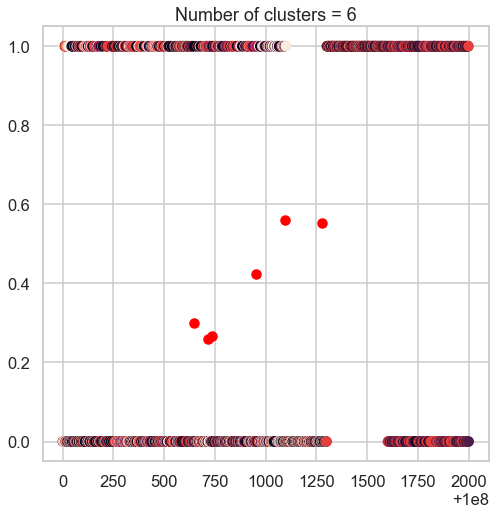

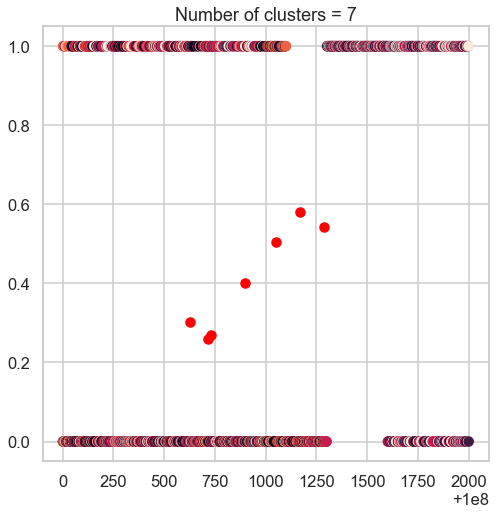

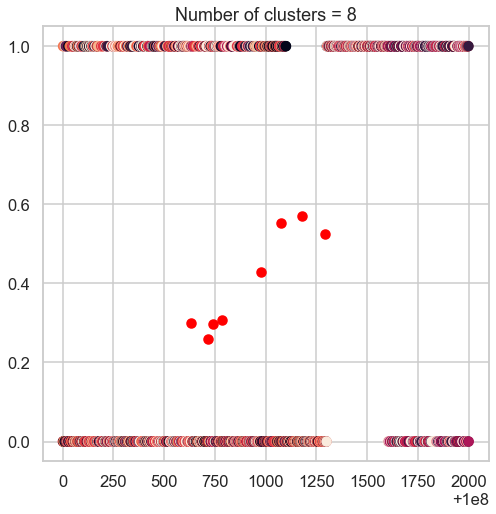

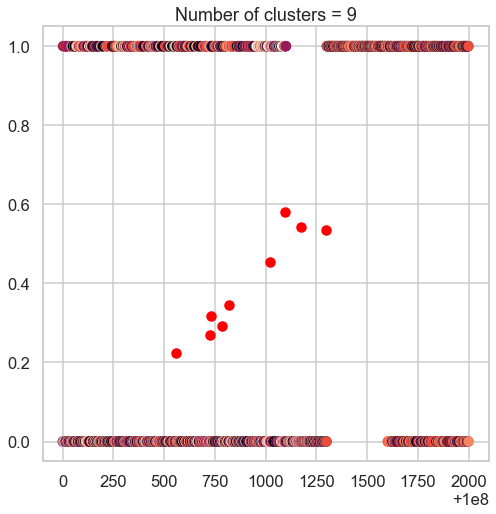

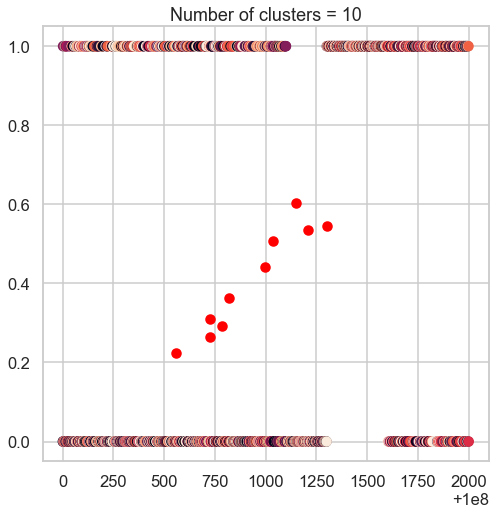

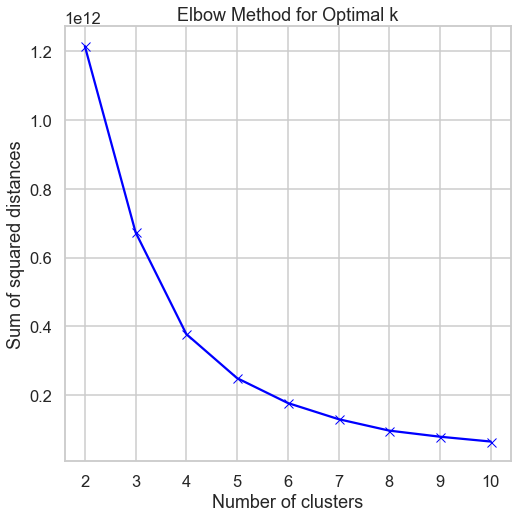

In [25]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.cluster import KMeans

# Load the data set into a Pandas DataFrame
df = pd.read_csv('Customer_data.csv')

# Extract the features you want to cluster on into a NumPy array
X = df[['ID','Sex', 'Marital status', 'Age', 'Education', 'Income', 'Occupation', 'Settlement size']].values

# Define the range of numbers of clusters to try
k_range = range(2, 11)

# Initialize an empty list to store the sum of squared distances for each number of clusters
sum_of_squared_distances = []

# Loop through each number of clusters and fit the data to a KMeans object
for k in k_range:
    kmeans = KMeans(n_clusters=k)
    kmeans.fit(X)
    sum_of_squared_distances.append(kmeans.inertia_)
    
    # Visualize the clusters for the current number of clusters
    labels = kmeans.labels_
    centroids = kmeans.cluster_centers_
    plt.figure()
    plt.scatter(X[:,0], X[:,1], c=labels)
    plt.scatter(centroids[:,0], centroids[:,1], c='r')
    plt.title('Number of clusters = ' + str(k))
    
# Plot the sum of squared distances for each number of clusters
plt.figure()
plt.plot(k_range, sum_of_squared_distances, 'bx-')
plt.xlabel('Number of clusters')
plt.ylabel('Sum of squared distances')
plt.title('Elbow Method for Optimal k')
plt.show()


# Hierarical Clustering


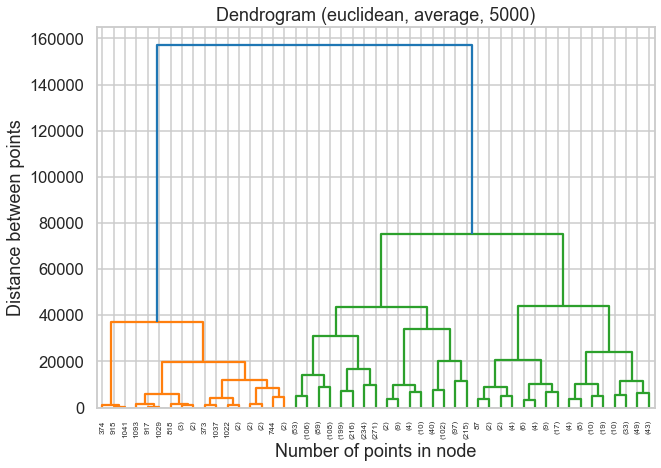

InvalidIndexError: (slice(None, None, None), 0)

<Figure size 576x432 with 0 Axes>

In [27]:
from sklearn.cluster import AgglomerativeClustering

from sklearn.metrics import silhouette_score
from scipy.cluster.hierarchy import dendrogram, linkage
from sklearn.cluster import SpectralClustering
from sklearn.metrics import pairwise_distances



# Agglomerative Clustering with different parameters
affinities = ['euclidean', 'cosine','manhattan']
linkages = ['average', 'single']
dist_thresholds = [5000, 7000,21500]

best_score = -1
best_params = {}

for aff in affinities:
    for linkage_type in linkages:
        for dist_threshold in dist_thresholds:
            # fit Agglomerative Clustering model
           
            Clustering_model = AgglomerativeClustering(affinity=aff, linkage=linkage_type, distance_threshold=dist_threshold,n_clusters=None)
            labels = Clustering_model.fit_predict(df)
            
           
            # calculate the silhouette score
            score = silhouette_score(df, labels)
            
            # check if this score is better than the previous best score
            if score > best_score:
                best_score = score
                best_params = {'affinity': aff, 'linkage': linkage_type, 'distance_threshold': dist_threshold}

            # plot the dendrogram
            plt.figure(figsize=(10, 7))
            if aff == 'manhattan':
                linkage_matrix = linkage(df, method=linkage_type, metric='cityblock')
            else:
                linkage_matrix = linkage(df, method=linkage_type, metric=aff)

            #linkage_matrix=linkage(Multi_blob_Data,metric=aff,method=linkage_type)
            dend = dendrogram(linkage_matrix, truncate_mode='level', p=5)
            plt.title(f"Dendrogram ({aff}, {linkage_type}, {dist_threshold})")
            plt.xlabel("Number of points in node")
            plt.ylabel("Distance between points")
            plt.show()

            # plot the resulting clusters
            plt.figure(figsize=(8, 6))
            plt.scatter(df[:, 0], df[:, 1], c=labels)
            plt.title(f"Agglomerative Clustering ({aff}, {linkage_type}, {dist_threshold})")
            plt.xlabel("Feature 1")
            plt.ylabel("Feature 2")
            plt.show()
            
print(f"Best silhouette score: {best_score} with parameters: {best_params}")


# DBSCAN Clustering